# Merging all parquet files into 1 CSV File

## 1. Importing Necessary Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import KFold

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=FutureWarning) 
warnings.filterwarnings("ignore", category=UserWarning) 

%config InlineBackend.figure_format = 'retina'

# to display all columns and rows:
pd.set_option('display.max_columns', None); pd.set_option('display.max_rows', None);  # to display all columns and rows
pd.set_option('display.float_format', lambda x: '%.2f' % x) # The number of numbers that will be shown after the comma.


## 2. Loading the Dataset

In [2]:
df = pd.read_csv("../data/merged_file.csv")

# 3. Data Analysis

### 3.1 Displaying top 5 rows

In [3]:
df.head()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,17,48,2,0,2944.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0.00,0.00,0.00,61333333.33,41666.67,48.00,0.00,48.00,48.00,48.00,48.00,0.00,48.00,48.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,41666.67,0.00,1472.00,1472.00,1472.00,0.00,0.00,0,0,0,0,0,0,0,0,0.00,2208.00,1472.00,0.00,0,0,0,0,0,0,2,2944,0,0,-1,-1,1,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,DrDoS_DNS
1,17,2,2,0,2944.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0.00,0.00,0.00,1472000000.00,1000000.00,2.00,0.00,2.00,2.00,2.00,2.00,0.00,2.00,2.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,-2,0,1000000.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0,0,0,0,0,0,0,0,0.00,2208.00,1472.00,0.00,0,0,0,0,0,0,2,2944,0,0,-1,-1,1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,DrDoS_DNS
2,17,1,2,0,2944.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0.00,0.00,0.00,2944000000.00,2000000.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,-2,0,2000000.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0,0,0,0,0,0,0,0,0.00,2208.00,1472.00,0.00,0,0,0,0,0,0,2,2944,0,0,-1,-1,1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,DrDoS_DNS
3,17,1,2,0,2944.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0.00,0.00,0.00,2944000000.00,2000000.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,2960,0,2000000.00,0.00,1472.00,1472.00,1472.00,0.00,0.00,0,0,0,0,0,0,0,0,0.00,2208.00,1472.00,0.00,0,0,0,0,0,0,2,2944,0,0,-1,-1,1,1480,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,DrDoS_DNS
4,17,1,2,0,2896.00,0.00,1448.00,1448.00,1448.00,0.00,0.00,0.00,0.00,0.00,2896000000.00,2000000.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,2000000.00,0.00,1448.00,1448.00,1448.00,0.00,0.00,0,0,0,0,0,0,0,0,0.00,2172.00,1448.00,0.00,0,0,0,0,0,0,2,2896,0,0,-1,-1,1,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,DrDoS_DNS


### 3.2 Displaying botton 5 rows

In [4]:
df.tail()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
431366,6,53,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,56603.77,26.50,37.48,53.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,32,64,18867.92,37735.85,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,1,1,0,2.00,0.00,0.00,0.00,0,0,0,0,0,0,1,0,2,0,244,251,0,32,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Benign
431367,6,66,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,45454.55,33.00,45.25,65.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,1.00,0,0,0,0,32,64,15151.52,30303.03,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,1,1,0,2.00,0.00,0.00,0.00,0,0,0,0,0,0,1,0,2,0,244,251,0,32,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Benign
431368,17,26288,2,2,96.00,96.00,48.00,48.00,48.00,0.00,48.00,48.00,48.00,0.00,7303.71,152.16,8762.67,15136.70,26241.00,1.00,46.00,46.00,0.00,46.00,46.00,1.00,1.00,0.00,1.00,1.00,0,0,0,0,40,40,76.08,76.08,48.00,48.00,48.00,0.00,0.00,0,0,0,0,0,0,0,0,1.00,60.00,48.00,48.00,0,0,0,0,0,0,2,96,2,96,-1,-1,1,20,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Benign
431369,6,30679,1,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,65.19,30679.00,0.00,30679.00,30679.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,32,32,32.60,32.60,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,1,1,0,1.00,0.00,0.00,0.00,0,0,0,0,0,0,1,0,1,0,266,290,0,32,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Benign
431370,6,67,1,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,44776.12,33.50,45.96,66.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,1.00,0,0,0,0,32,64,14925.37,29850.75,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,1,1,0,2.00,0.00,0.00,0.00,0,0,0,0,0,0,1,0,2,0,290,266,0,32,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Benign


### 3.3 Displaying shape of the Dataset

In [5]:
s=df.shape
print('total number of rows:', s[0])
print('total number of columns:',s[1])

total number of rows: 431371
total number of columns: 78


### 3.4 information of dataset

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 431371 entries, 0 to 431370
Data columns (total 78 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Protocol                  431371 non-null  int64  
 1   Flow Duration             431371 non-null  int64  
 2   Total Fwd Packets         431371 non-null  int64  
 3   Total Backward Packets    431371 non-null  int64  
 4   Fwd Packets Length Total  431371 non-null  float64
 5   Bwd Packets Length Total  431371 non-null  float64
 6   Fwd Packet Length Max     431371 non-null  float64
 7   Fwd Packet Length Min     431371 non-null  float64
 8   Fwd Packet Length Mean    431371 non-null  float64
 9   Fwd Packet Length Std     431371 non-null  float64
 10  Bwd Packet Length Max     431371 non-null  float64
 11  Bwd Packet Length Min     431371 non-null  float64
 12  Bwd Packet Length Mean    431371 non-null  float64
 13  Bwd Packet Length Std     431371 non-null  f

### 3.5 display column name

In [7]:
df.columns

Index(['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Fla

### 3.6 Finding duplicates

In [8]:
print('any duplicates in dataset:', df.duplicated().sum().any())

any duplicates in dataset: True


In [9]:
print('total no of duplicates iin dataset:',df.duplicated().sum().sum())

total no of duplicates iin dataset: 5317


#### droping duplicates

In [10]:
df = df.drop_duplicates()

In [11]:
df.duplicated().sum().sum()

0

### 3.7 Finding Null values

In [12]:
print('any null values in dataset:', df.isnull().sum().any())

any null values in dataset: False


In [13]:
print('Total no of null values in dataset:', df.isnull().sum().sum())

Total no of null values in dataset: 0


### 3.8 display datatypes of each columns

In [14]:
df.dtypes

Protocol                      int64
Flow Duration                 int64
Total Fwd Packets             int64
Total Backward Packets        int64
Fwd Packets Length Total    float64
Bwd Packets Length Total    float64
Fwd Packet Length Max       float64
Fwd Packet Length Min       float64
Fwd Packet Length Mean      float64
Fwd Packet Length Std       float64
Bwd Packet Length Max       float64
Bwd Packet Length Min       float64
Bwd Packet Length Mean      float64
Bwd Packet Length Std       float64
Flow Bytes/s                float64
Flow Packets/s              float64
Flow IAT Mean               float64
Flow IAT Std                float64
Flow IAT Max                float64
Flow IAT Min                float64
Fwd IAT Total               float64
Fwd IAT Mean                float64
Fwd IAT Std                 float64
Fwd IAT Max                 float64
Fwd IAT Min                 float64
Bwd IAT Total               float64
Bwd IAT Mean                float64
Bwd IAT Std                 

### Note*: By observing the data

#### Continous columns

'Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count',
       'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count', 'Down/Up Ratio',
       'Avg Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size',
       'Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
       'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate',
       'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets',
       'Subflow Bwd Bytes', 'Init Fwd Win Bytes', 'Init Bwd Win Bytes',
       'Fwd Act Data Packets', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
       'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max',
       'Idle Min'

### Categorical columns

Label

### 3.9 Statistical analysis of dataset

In [15]:
df.describe()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
count,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00,426054.00
mean,14.02,8509682.93,24.41,2.49,9532.94,1653.10,361.17,297.79,328.27,20.35,80.49,8.75,26.18,21.31,73949841.25,118817.59,809828.07,1430851.07,3787421.48,4366.62,8433437.84,988417.32,1559545.74,3744888.10,4031.03,3728308.35,436648.56,824315.68,2079865.64,0.93,0.03,0.00,0.00,0.00,-186497739.99,-1153942.29,117223.79,1593.80,297.38,411.46,336.30,32.28,15156.44,0.00,0.00,0.03,0.00,0.17,0.09,0.05,0.00,0.24,401.68,328.27,26.18,0.00,0.00,0.00,0.00,0.00,0.00,24.41,9532.94,2.49,1653.10,2327.17,800.01,22.16,-23388142.32,34129.73,25956.91,68415.08,18916.80,2480481.61,504545.18,3008204.77,2018725.03
std,4.93,21377400.17,197.09,56.72,34651.08,107067.38,319.79,273.15,268.05,71.09,493.67,32.13,126.30,129.23,333467735.29,400071.68,1611444.11,2812811.92,9031225.98,240210.69,21370213.69,2004392.32,3192623.54,9015543.93,240671.84,16428358.81,1912416.85,3511775.45,8872532.15,5.12,0.16,0.00,0.00,0.00,4293358247.35,59432445.61,397987.18,31028.21,272.62,531.48,267.02,118.81,206207.75,0.00,0.02,0.16,0.00,0.38,0.29,0.21,0.00,0.63,362.21,268.05,126.30,0.00,0.00,0.00,0.00,0.00,0.00,197.09,34651.08,56.72,107067.38,7790.07,5370.64,54.85,155940442.39,324294.73,224020.83,521543.13,284955.05,7958473.41,2016859.86,9095462.99,7287182.35
min,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.33,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-212543795000.00,-17003494240.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,-1.00,-1.00,0.00,-1408237563.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,6.00,855.00,4.00,0.00,84.00,0.00,38.00,6.00,32.25,0.00,0.00,0.00,0.00,0.00,655.97,1.33,43.67,57.51,204.00,0.00,112.00,6.51,11.80,48.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,28.00,0.00,1.33,0.00,6.00,60.00,48.40,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,60.50,32.25,0.00,0.00,0.00,0.00,0.00,0

In [16]:
df[['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count',
       'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count', 'Down/Up Ratio',
       'Avg Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size',
       'Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
       'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate',
       'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets',
       'Subflow Bwd Bytes', 'Init Fwd Win Bytes', 'Init Bwd Win Bytes',
       'Fwd Act Data Packets', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
       'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max',
       'Idle Min']].describe().T

,count,mean,std,min,25%,50%,75%,max
Protocol,426054.00,14.02,4.93,0.00,6.00,17.00,17.00,17.00
Flow Duration,426054.00,8509682.93,21377400.17,1.00,855.00,46113.50,3002898.75,119998742.00
Total Fwd Packets,426054.00,24.41,197.09,1.00,4.00,5.00,16.00,86666.00
Total Backward Packets,426054.00,2.49,56.72,0.00,0.00,0.00,2.00,31700.00
Fwd Packets Length Total,426054.00,9532.94,34651.08,0.00,84.00,2064.00,5280.00,15266416.00
Bwd Packets Length Total,426054.00,1653.10,107067.38,0.00,0.00,0.00,0.00,58429504.00
Fwd Packet Length Max,426054.00,361.17,319.79,0.00,38.00,440.00,516.00,32120.00
Fwd Packet Length Min,426054.00,297.79,273.15,0.00,6.00,330.00,516.00,2131.00
Fwd Packet Length Mean,426054.00,328.27,268.05,0.00,32.25,429.71,516.00,3015.29
Fwd Packet Length Std,426054.00,20.35,71.09,0.00,0.00,0.00,0.00,2221.56


### 3.10 relationship between columns

In [17]:
df[['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count',
       'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count', 'Down/Up Ratio',
       'Avg Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size',
       'Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
       'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate',
       'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets',
       'Subflow Bwd Bytes', 'Init Fwd Win Bytes', 'Init Bwd Win Bytes',
       'Fwd Act Data Packets', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
       'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max',
       'Idle Min']].corr()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Protocol,1.00,-0.56,0.03,-0.06,0.15,-0.02,0.43,0.65,0.68,-0.17,-0.23,0.09,-0.20,-0.27,0.13,0.09,-0.49,-0.52,-0.51,-0.01,-0.56,-0.53,-0.53,-0.51,-0.01,-0.37,-0.37,-0.38,-0.38,-0.18,-0.26,NaN,NaN,NaN,-0.03,-0.01,0.09,-0.08,0.65,0.13,0.64,-0.23,-0.11,NaN,-0.03,-0.26,NaN,-0.75,-0.51,-0.36,NaN,-0.33,0.58,0.68,-0.20,NaN,NaN,NaN,NaN,NaN,NaN,0.03,0.15,-0.06,-0.02,-0.49,-0.24,0.17,-0.09,-0.15,-0.18,-0.20,-0.09,-0.51,-0.41,-0.54,-0.45
Flow Duration,-0.56,1.00,-0.01,0.10,-0.09,0.03,-0.10,-0.35,-0.35,0.21,0.28,-0.07,0.19,0.29,-0.09,-0.12,0.67,0.78,0.86,0.02,1.00,0.76,0.81,0.86,0.02,0.79,0.57,0.64,0.72,0.03,0.02,NaN,NaN,NaN,0.02,0.01,-0.12,-0.02,-0.35,0.09,-0.33,0.24,0.09,NaN,-0.01,0.02,NaN,0.66,-0.06,-0.09,NaN,-0.06,-0.30,-0.35,0.19,NaN,NaN,NaN,NaN,NaN,NaN,-0.01,-0.09,0.10,0.03,0.31,-0.01,-0.07,0.04,0.20,0.32,0.32,0.08,0.84,0.56,0.87,0.77
Total Fwd Packets,0.03,-0.01,1.00,0.18,0.17,0.17,0.04,0.02,0.03,0.01,0.02,-0.03,0.02,0.01,-0.02,-0.02,-0.04,-0.04,-0.02,-0.00,-0.01,-0.04,-0.03,-0.01,-0.00,0.01,-0.01,-0.01,0.00,-0.02,-0.01,NaN,NaN,NaN,-0.02,0.00,-0.01,-0.01,0.02,0.04,0.03,0.02,0.02,NaN,-0.00,-0.01,NaN,-0.03,-0.03,-0.03,NaN,-0.04,0.01,0.03,0.02,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.17,0.18,0.17,-0.01,-0.01,0.28,0.01,0.00,0.00,0.01,0.00,-0.00,-0.01,-0.01,-0.00
Total Backward Packets,-0.06,0.10,0.18,1.00,0.03,0.97,0.06,-0.05,-0.04,0.08,0.23,0.00,0.22,0.17,-0.01,-0.01,0.00,0.03,0.10,-0.00,0.10,0.02,0.04,0.09,-0.00,0.12,0.03,0.05,0.10,0.00,0.01,NaN,NaN,NaN,0.00,-0.00,-0.01,0.00,-0.05,0.19,0.02,0.20,0.21,NaN,-0.00,0.01,NaN,0.07,0.00,-0.00,NaN,0.05,0.01,-0.04,0.22,NaN,NaN,NaN,NaN,NaN,NaN,0.18,0.03,1.00,0.97,0.08,0.01,0.51,0.01,0.07,0.06,0.08,0.05,0.10,0.03,0.09,0.10
Fwd Packets Length Total,0.15,-0.09,0.17,0.03,1.00,0.00,0.25,0.10,0.14,0.04,-0.02,-0.07,-0.04,-0.02,-0.02,-0.02,-0.12,-0.12,-0.10,-0.00,-0.09,-0.12,-0.12,-0.09,-0.00,-0.04,-0.06,-0.06,-0.05,-0.05,-0.04,NaN,NaN,NaN,-0.05,0.00,-0.02,-0.01,0.10,0.13,0.13,0.00,0.03,NaN,-0.01,-0.04,NaN,-0.11,-0.08,-0.06,NaN,-0.10,0.06,0.14,-0.04,NaN,NaN,NaN,NaN,NaN,NaN,0.17,1.00,0.03,0.00,-0.07,-0.03,0.61,0.01,-0.02,-0.02,-0.02,-0.01,-0.07,-0.06,-0.08,-0.06
Bwd Packets Length Total,-0.02,0.03,0.17,0.97,0.00,1.00,0.03,-0.02,-0.02,0.03,0.26,-0.00,0.21,0.17,-0.00,-0.00,-0.01,0.00,0.04,-0.00,0.03,-0.00,0.01,0.04,-0.00,0.04,-0.00,0.01,0.04,-0.00,-0.00,NaN,NaN,NaN,0.00,-0.00,-0.00,-0.00,-0.02,0.23,0.05,0.19,0.34,NaN,-0.00,-0.00,NaN,0.03,-0.00,-0.00,NaN,0.03,0.03,-0.02,0.21,NaN,NaN,NaN,NaN,NaN,NaN,0.17,0.00,0.97,1.00,0.05,0.00,0.49,0.00,0.04,0.02,0.03,0.03,0.04,0.01,0.03,0.04
Fwd Packet Length Max,0.43,-0.10,0.04,0.06,0.25,0.03,1.00,0.70,0.81,0.49,0.22,-0.26,0.12,0.25,0.41,0.25,-0.27,-0.22,-0.10,-0.01,-0.10,-0.28,-0.19,-0.10,-0.01,0.09,-0.17,-0.12,-0.02,-0.18,-0.11,NaN,NaN,NaN,-0.01,

## 4. Data cleaning

## Finding the Missing Values

In [18]:
df.isnull().sum().any()

False

### Finding toatal number of null values in the dataset

In [19]:
df.isnull().sum().sum()

0

### Finding each column whether null values there are not

In [20]:
df.isnull().any()

Protocol                    False
Flow Duration               False
Total Fwd Packets           False
Total Backward Packets      False
Fwd Packets Length Total    False
Bwd Packets Length Total    False
Fwd Packet Length Max       False
Fwd Packet Length Min       False
Fwd Packet Length Mean      False
Fwd Packet Length Std       False
Bwd Packet Length Max       False
Bwd Packet Length Min       False
Bwd Packet Length Mean      False
Bwd Packet Length Std       False
Flow Bytes/s                False
Flow Packets/s              False
Flow IAT Mean               False
Flow IAT Std                False
Flow IAT Max                False
Flow IAT Min                False
Fwd IAT Total               False
Fwd IAT Mean                False
Fwd IAT Std                 False
Fwd IAT Max                 False
Fwd IAT Min                 False
Bwd IAT Total               False
Bwd IAT Mean                False
Bwd IAT Std                 False
Bwd IAT Max                 False
Bwd IAT Min   

### Finding each column how many null values count

In [21]:
df.isnull().sum()

Protocol                    0
Flow Duration               0
Total Fwd Packets           0
Total Backward Packets      0
Fwd Packets Length Total    0
Bwd Packets Length Total    0
Fwd Packet Length Max       0
Fwd Packet Length Min       0
Fwd Packet Length Mean      0
Fwd Packet Length Std       0
Bwd Packet Length Max       0
Bwd Packet Length Min       0
Bwd Packet Length Mean      0
Bwd Packet Length Std       0
Flow Bytes/s                0
Flow Packets/s              0
Flow IAT Mean               0
Flow IAT Std                0
Flow IAT Max                0
Flow IAT Min                0
Fwd IAT Total               0
Fwd IAT Mean                0
Fwd IAT Std                 0
Fwd IAT Max                 0
Fwd IAT Min                 0
Bwd IAT Total               0
Bwd IAT Mean                0
Bwd IAT Std                 0
Bwd IAT Max                 0
Bwd IAT Min                 0
Fwd PSH Flags               0
Bwd PSH Flags               0
Fwd URG Flags               0
Bwd URG Fl

## Distribution of the Categorical Column: Label

### How many non unique values are there

In [22]:
df['Label'].nunique()

18

### What are those categories names

In [23]:
df['Label'].unique()

array(['DrDoS_DNS', 'Benign', 'DrDoS_LDAP', 'NetBIOS', 'LDAP',
       'DrDoS_MSSQL', 'MSSQL', 'DrDoS_NetBIOS', 'DrDoS_NTP', 'Portmap',
       'DrDoS_SNMP', 'Syn', 'TFTP', 'DrDoS_UDP', 'UDP', 'UDP-lag',
       'WebDDoS', 'UDPLag'], dtype=object)

### Each Category how many records are there

In [24]:
df['Label'].value_counts()

Label
DrDoS_NTP        121368
TFTP              98917
Benign            94682
Syn               47779
UDP               17795
DrDoS_UDP         10420
UDP-lag            8872
MSSQL              8434
DrDoS_MSSQL        6212
DrDoS_DNS          3669
DrDoS_SNMP         2717
LDAP               1885
DrDoS_LDAP         1440
Portmap             685
DrDoS_NetBIOS       598
NetBIOS             475
UDPLag               55
WebDDoS              51
Name: count, dtype: int64

### Calculating the Percentage

In [25]:
df["Label"].value_counts()*100/len(df)

Label
DrDoS_NTP       28.49
TFTP            23.22
Benign          22.22
Syn             11.21
UDP              4.18
DrDoS_UDP        2.45
UDP-lag          2.08
MSSQL            1.98
DrDoS_MSSQL      1.46
DrDoS_DNS        0.86
DrDoS_SNMP       0.64
LDAP             0.44
DrDoS_LDAP       0.34
Portmap          0.16
DrDoS_NetBIOS    0.14
NetBIOS          0.11
UDPLag           0.01
WebDDoS          0.01
Name: count, dtype: float64

# 5. EDA

#### creating function for continous data statistical analysis

In [26]:
def display_analysis_updated(column):
    try:
        # Create subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        
        # KDE plot
        sns.kdeplot(df[column].dropna(), ax=axes[0], fill=True, color='skyblue')
        axes[0].set_title(f'Distribution of {column} (KDE)')
        
        # Box plot
        sns.boxplot(df[column].dropna(), ax=axes[1], color='lightgreen')
        axes[1].set_title(f'{column} Box Plot')
        
        # Display plots
        plt.tight_layout()
        plt.show()
        
        # Calculate skewness and kurtosis
        skewness = df[column].skew()
        kurtosis = df[column].kurtosis()
        mini = df[column].min()
        maxi = df[column].max()
        Q1 = df[column].quantile(0.25)
        Q2 = df[column].quantile(0.5)
        Q3 = df[column].quantile(0.75)
        
        IQR = Q3 - Q1
        LLP = Q1 - 1.5*IQR
        ULP = Q3 + 1.5*IQR
        
        return skewness, kurtosis, mini, maxi, Q1, Q2, Q3, IQR, LLP, ULP
    except Exception as e:
        print(f"Error processing column {column}: {e}")
        return None, None, None, None, None, None, None, None, None, None

#### creating function for categorical data statistical analysis

In [27]:
def plot_column_distribution(df, column_name):
    if column_name not in df.columns:
        print(f"Error: Column '{column_name}' does not exist in the DataFrame.")
        return

    # Compute unique values, counts, and percentages
    unique_count = df[column_name].nunique()
    unique_values = df[column_name].unique()
    value_counts = df[column_name].value_counts()
    value_percentages = df[column_name].value_counts() * 100 / len(df)

    print(f"Unique values in '{column_name}': {unique_values}")
    print(f"Number of unique values in '{column_name}': {unique_count}")

    # Set up the subplots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Bar chart
    value_counts.sort_index().plot(kind='bar', ax=axes[0])
    axes[0].set_title(f'Frequency of {column_name}')
    axes[0].set_xlabel(f'{column_name}')
    axes[0].set_ylabel('Count')
    axes[0].grid(axis='y', linestyle='--', alpha=0.7)

    # Pie chart
    value_percentages.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        cmap='viridis',
        legend=False,
        ax=axes[1]
    )
    axes[1].set_title(f'Distribution of {column_name} (%)')
    axes[1].set_ylabel('')  # Hide y-label for better visualization

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()


### 5.1 Continuous data Analysis


Analysis for Protocol:


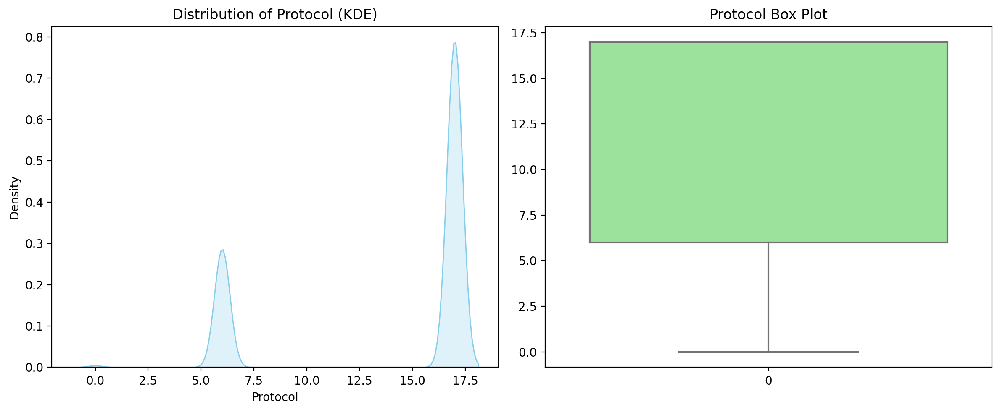


Analysis for Flow Duration:


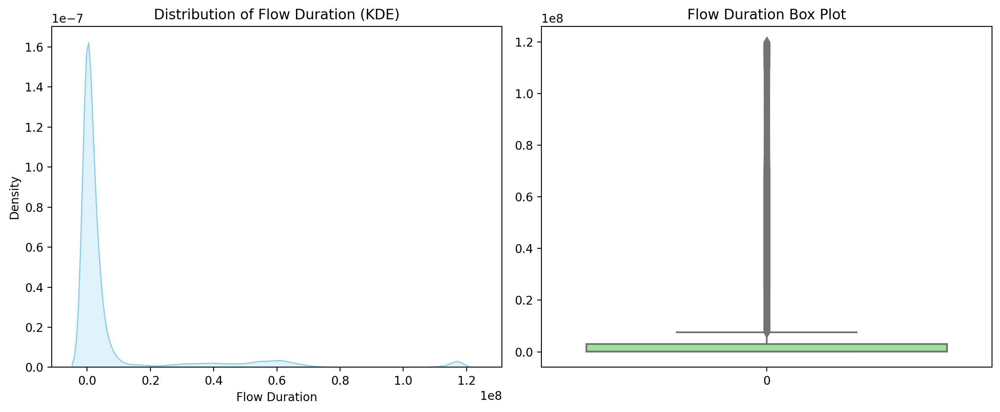


Analysis for Total Fwd Packets:


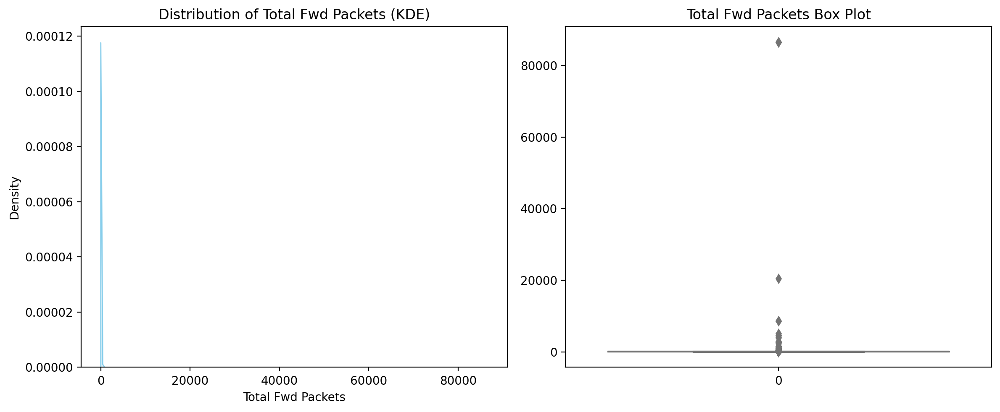


Analysis for Total Backward Packets:


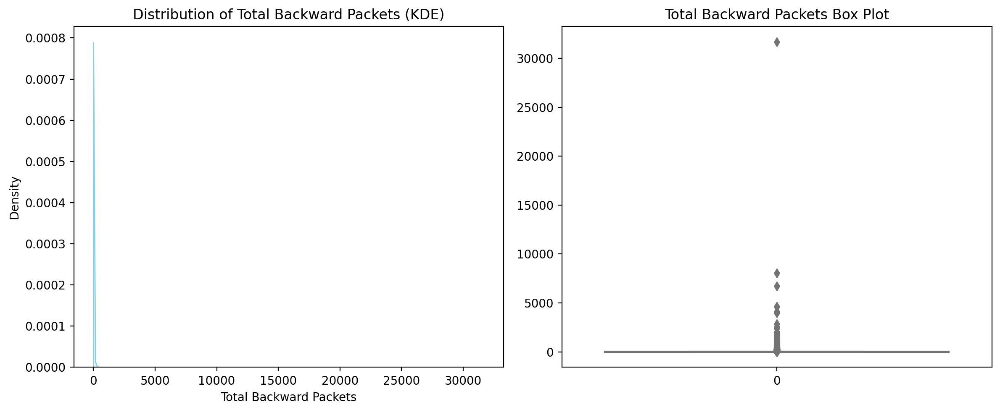


Analysis for Fwd Packets Length Total:


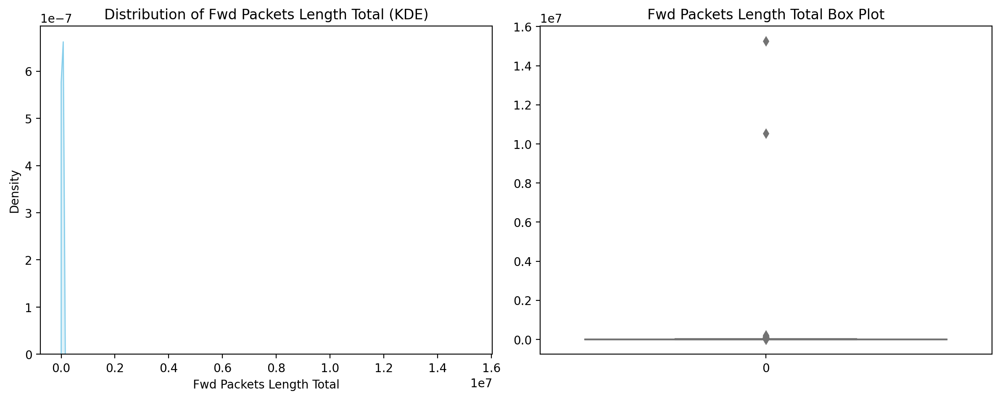


Analysis for Bwd Packets Length Total:


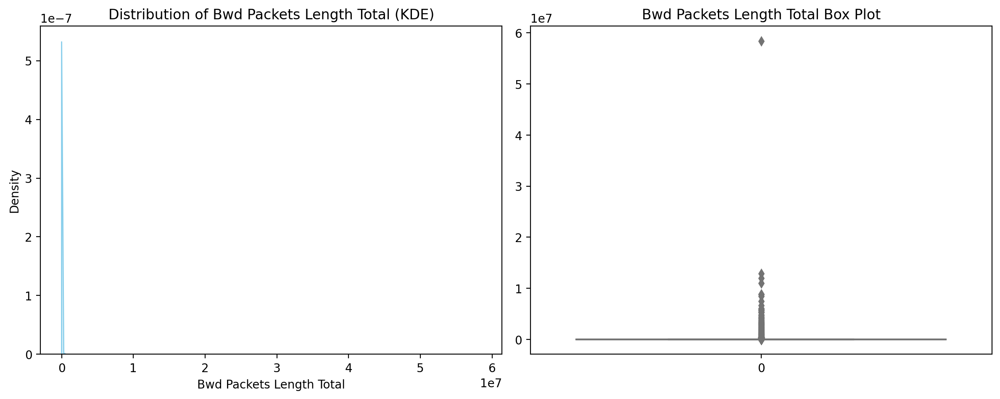


Analysis for Fwd Packet Length Max:


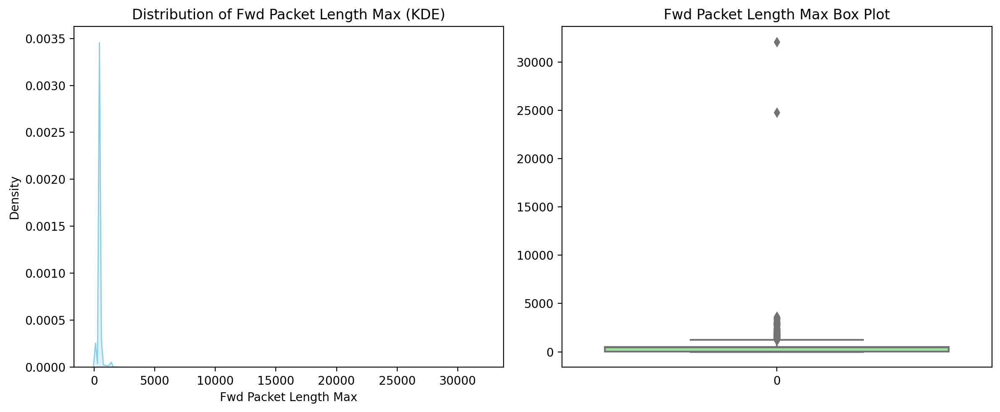


Analysis for Fwd Packet Length Min:


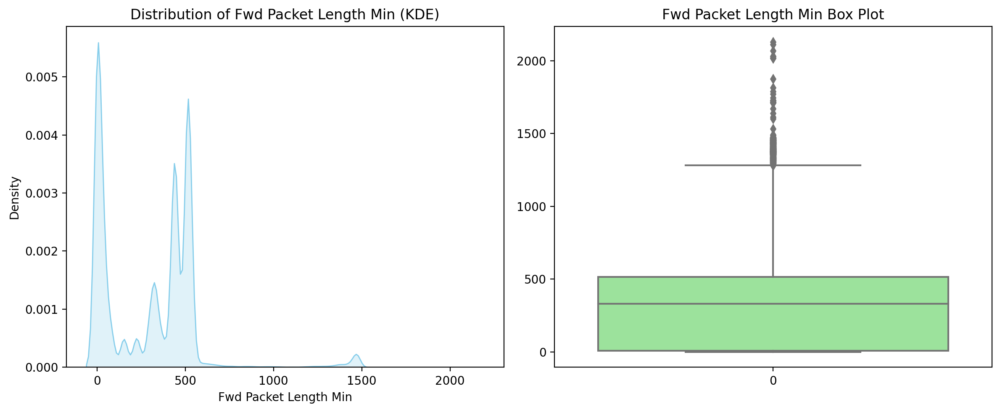


Analysis for Fwd Packet Length Mean:


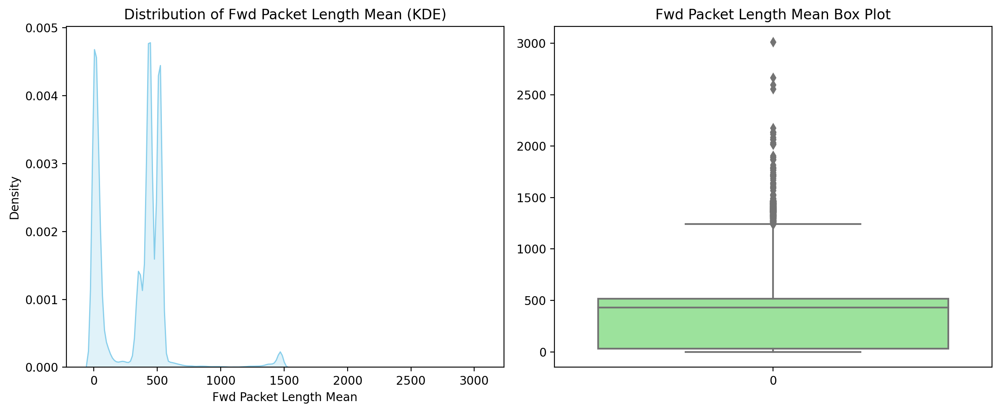


Analysis for Fwd Packet Length Std:


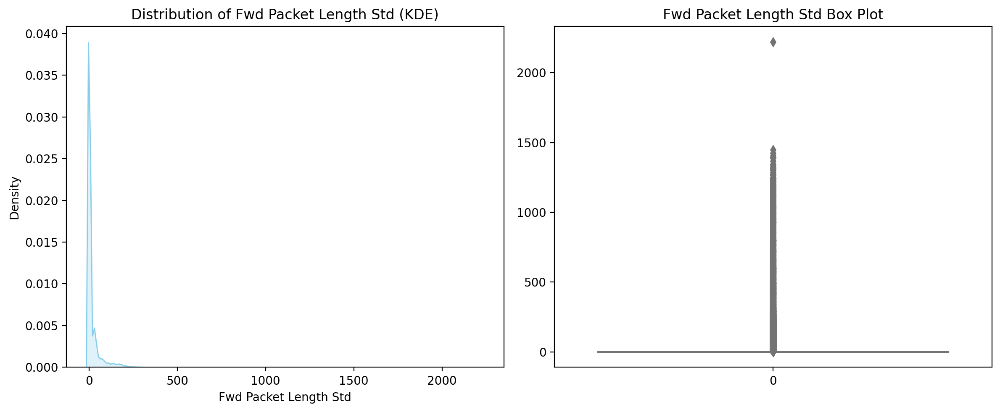


Analysis for Bwd Packet Length Max:


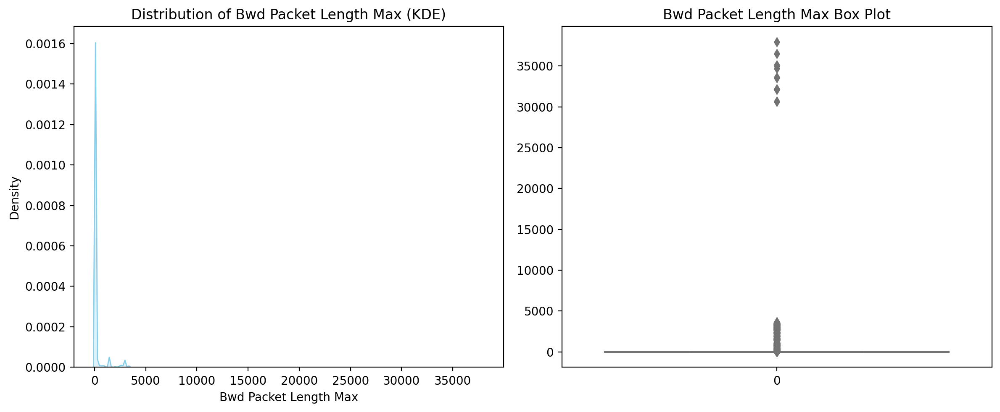


Analysis for Bwd Packet Length Min:


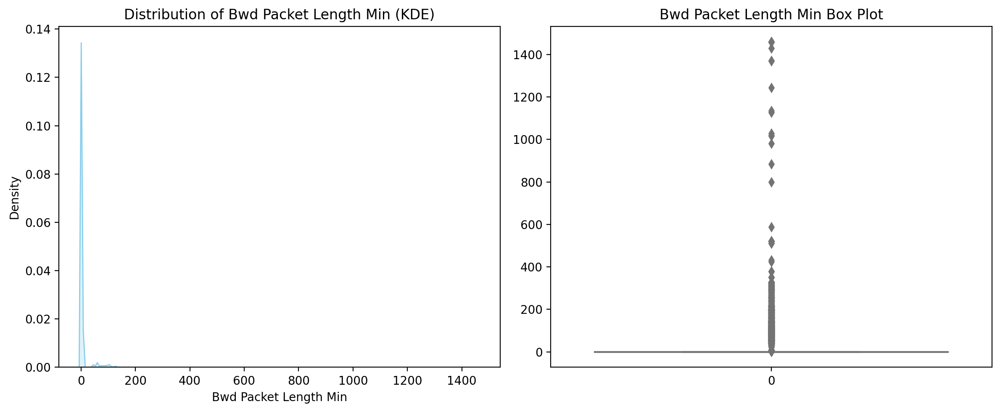


Analysis for Bwd Packet Length Mean:


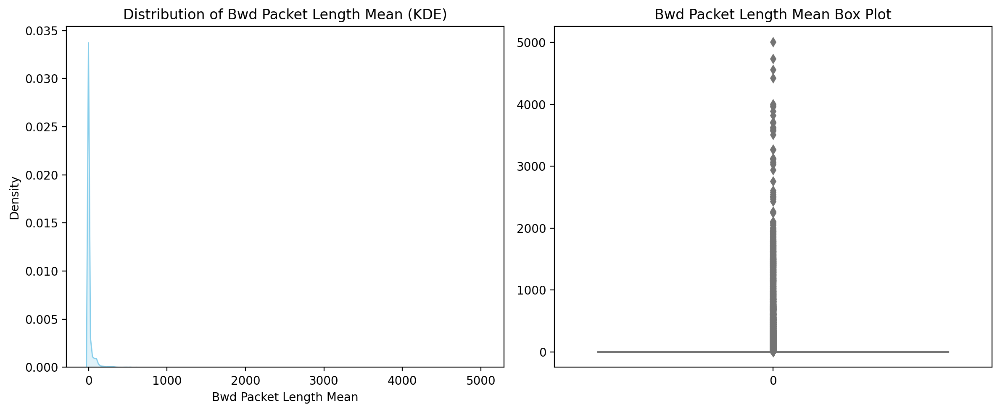


Analysis for Bwd Packet Length Std:


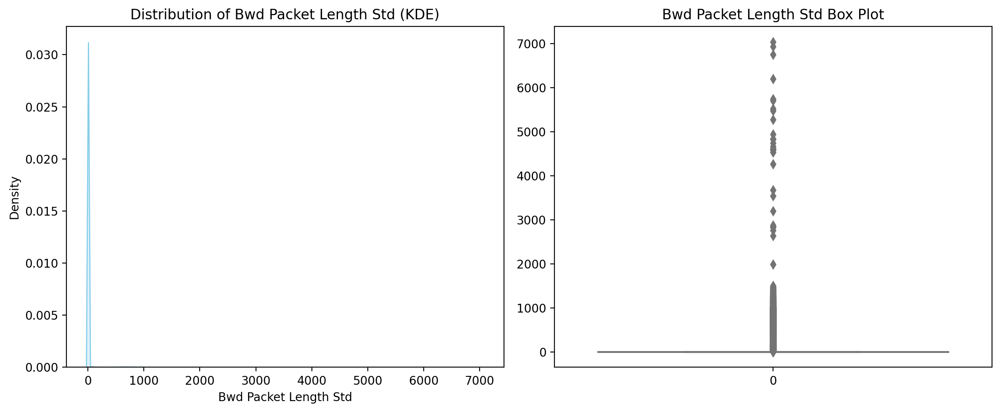


Analysis for Flow Bytes/s:


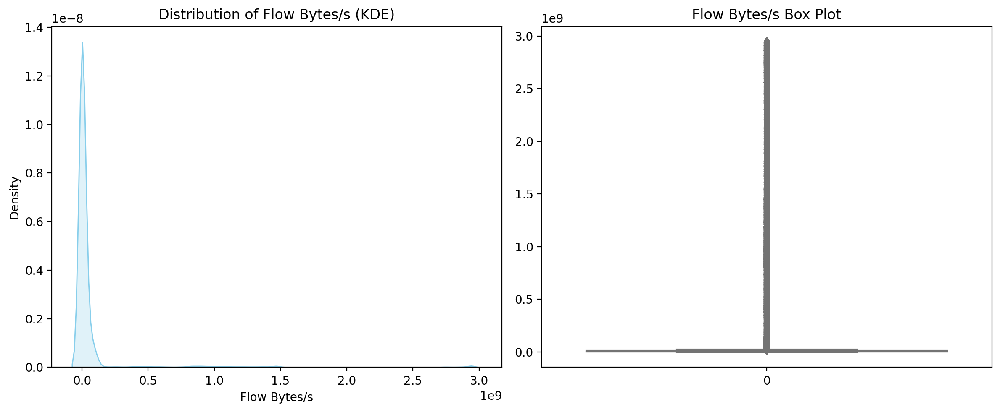


Analysis for Flow Packets/s:


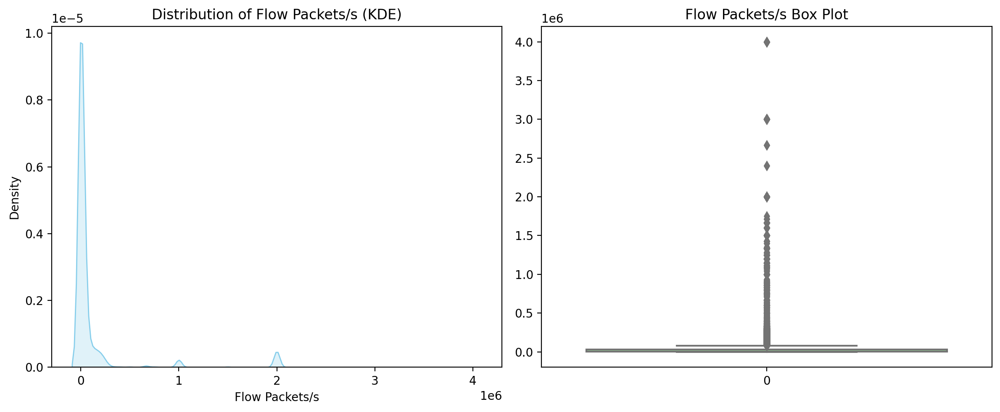


Analysis for Flow IAT Mean:


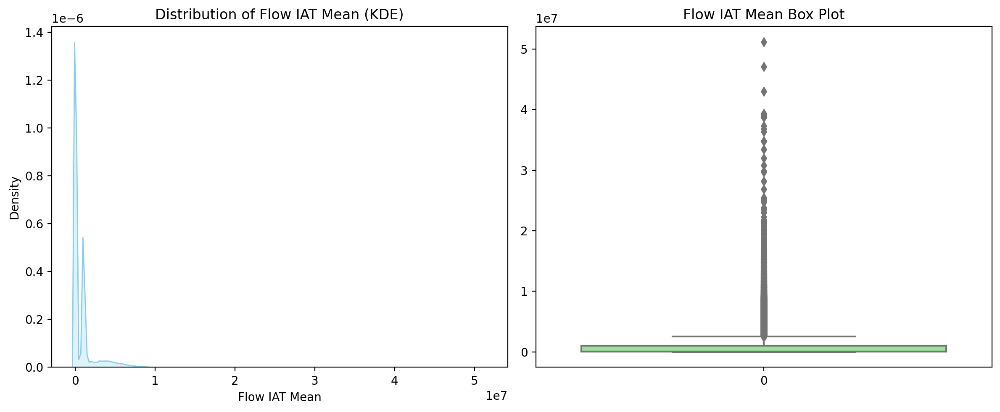


Analysis for Flow IAT Std:


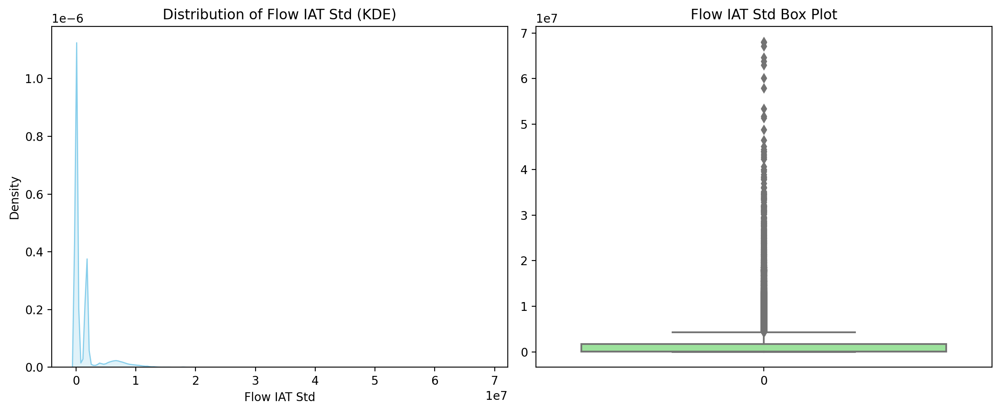


Analysis for Flow IAT Max:


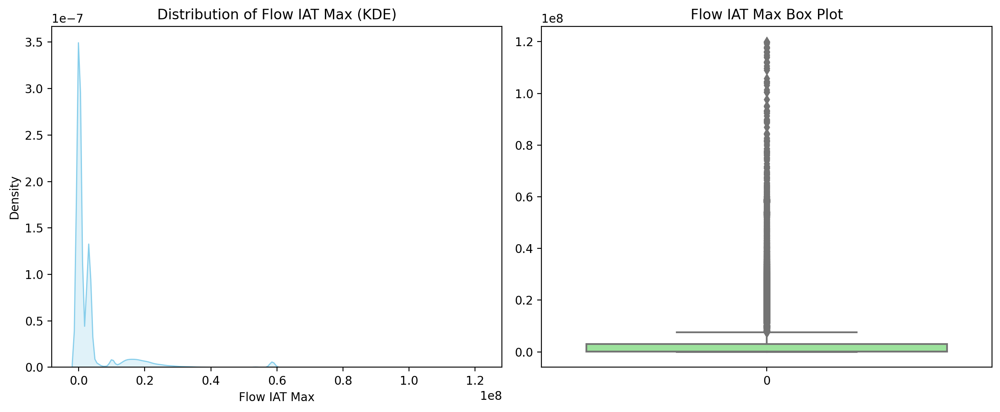


Analysis for Flow IAT Min:


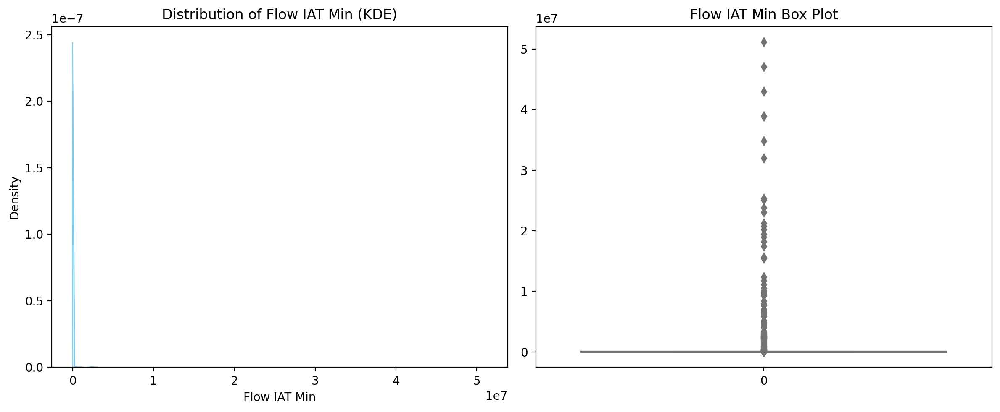


Analysis for Fwd IAT Total:


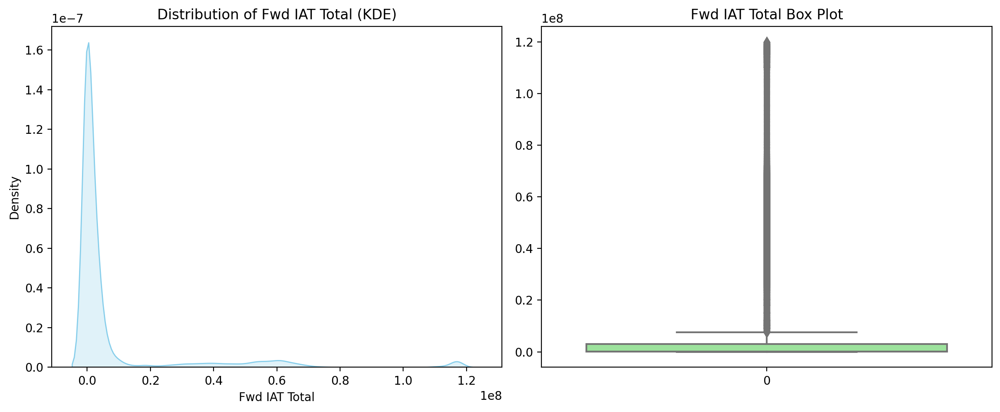


Analysis for Fwd IAT Mean:


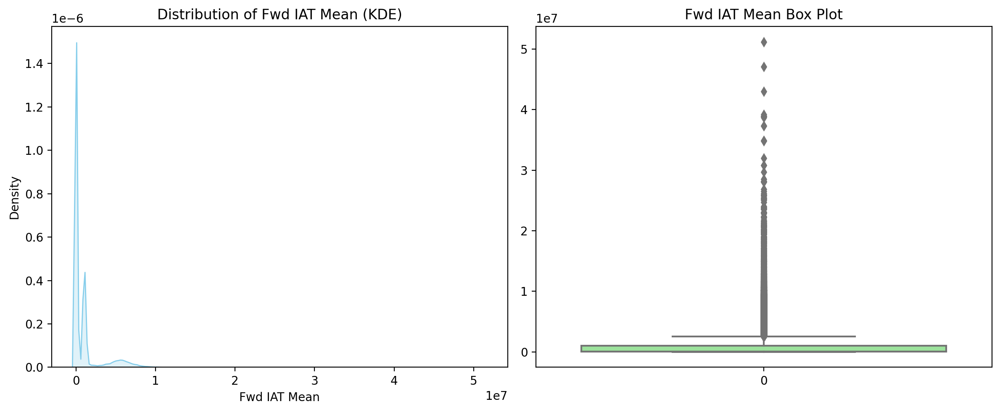


Analysis for Fwd IAT Std:


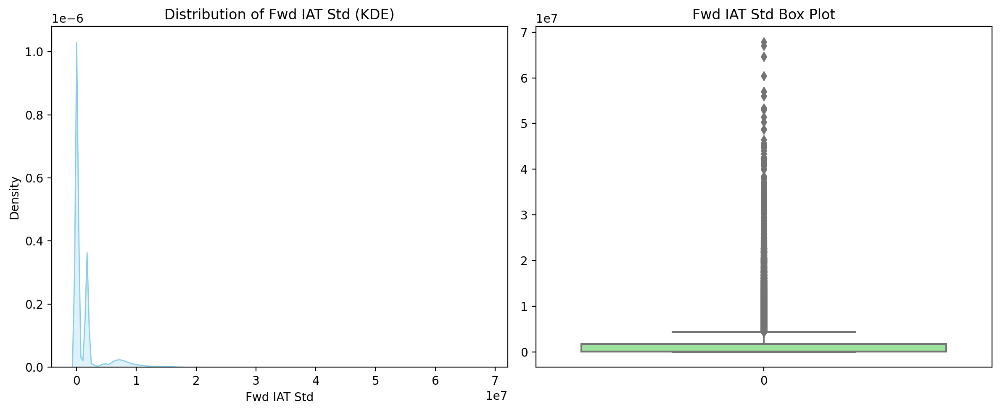


Analysis for Fwd IAT Max:


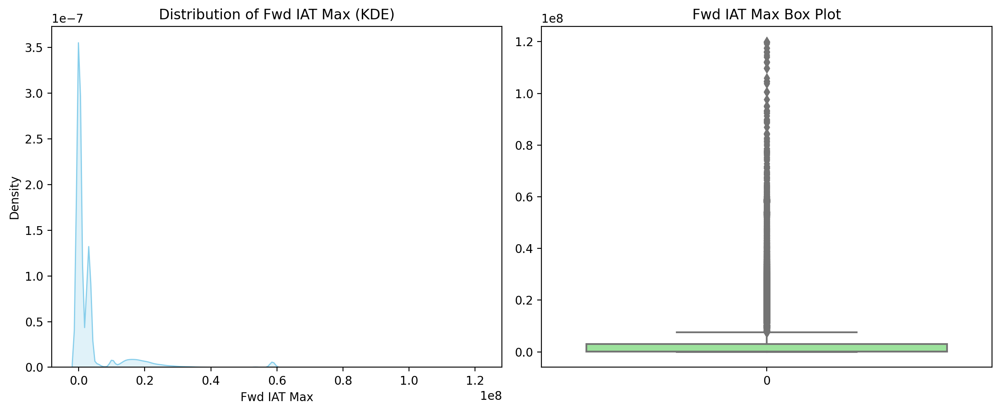


Analysis for Fwd IAT Min:


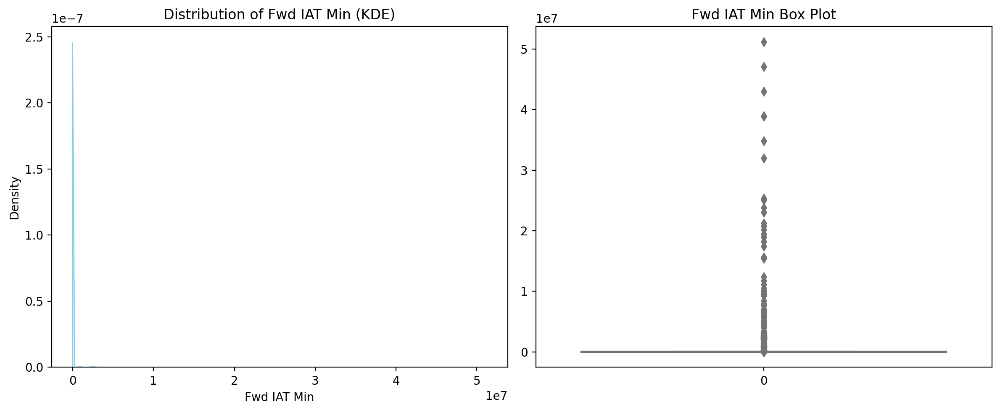


Analysis for Bwd IAT Total:


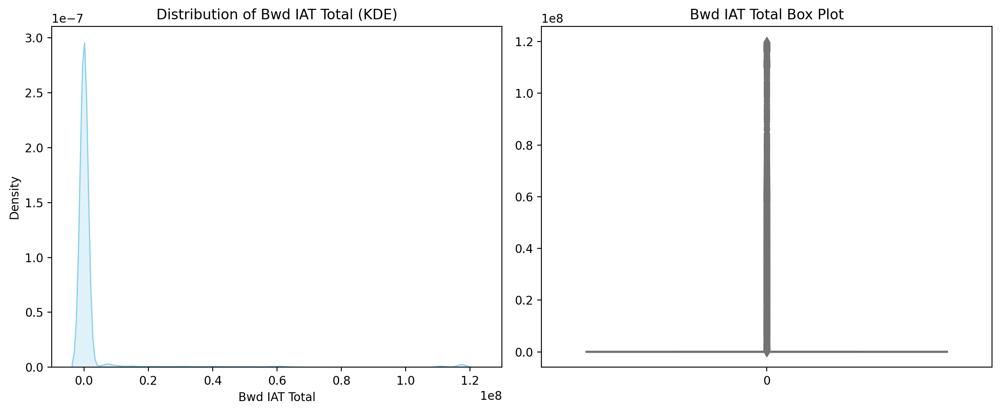


Analysis for Bwd IAT Mean:


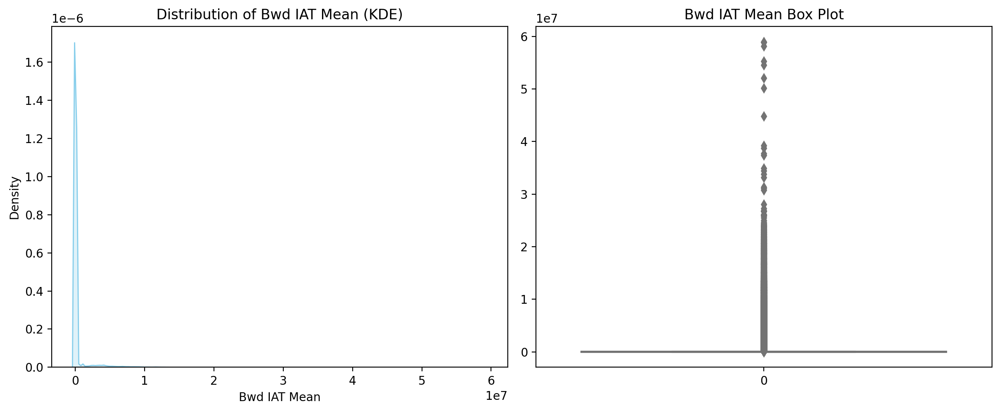


Analysis for Bwd IAT Std:


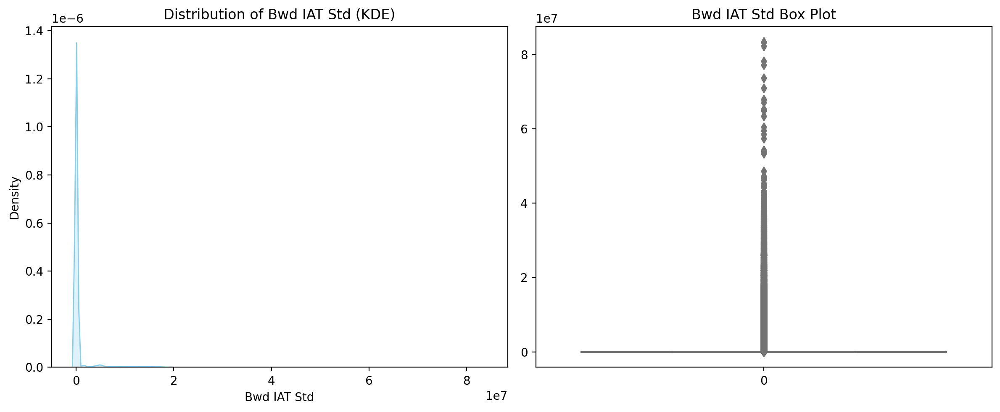


Analysis for Bwd IAT Max:


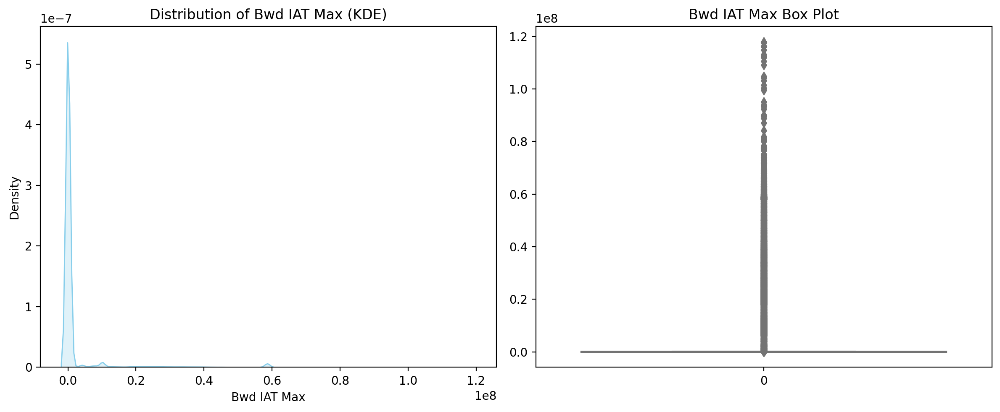


Analysis for Bwd IAT Min:


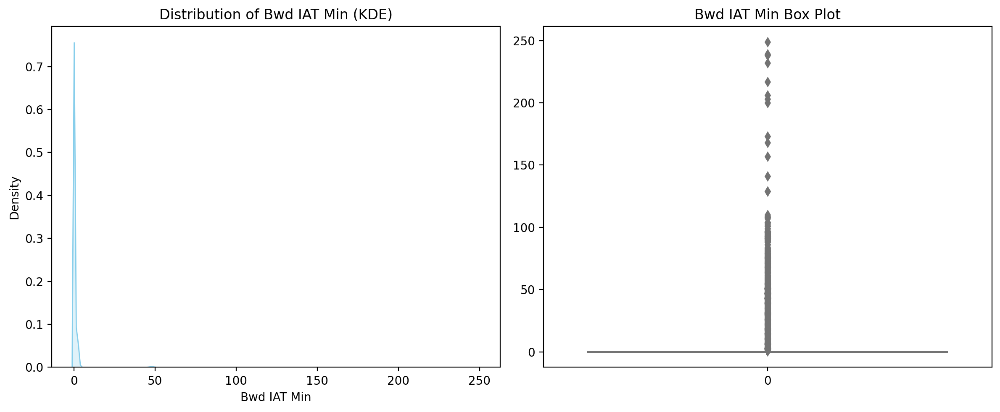


Analysis for Fwd PSH Flags:


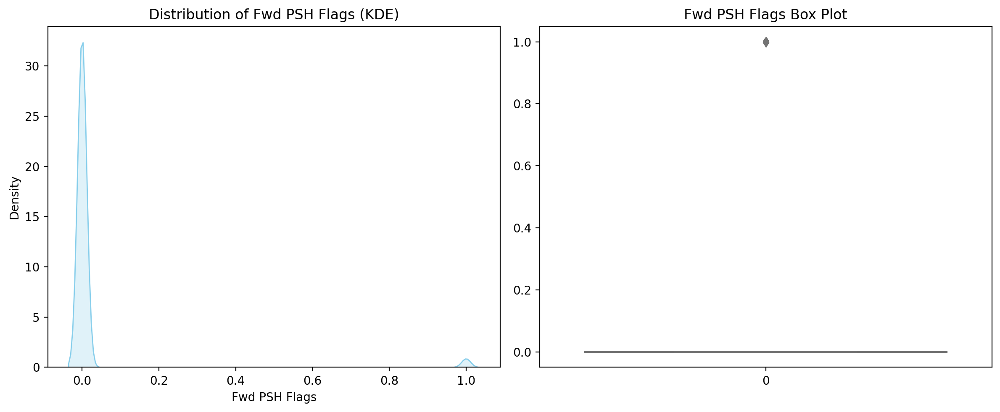


Analysis for Bwd PSH Flags:


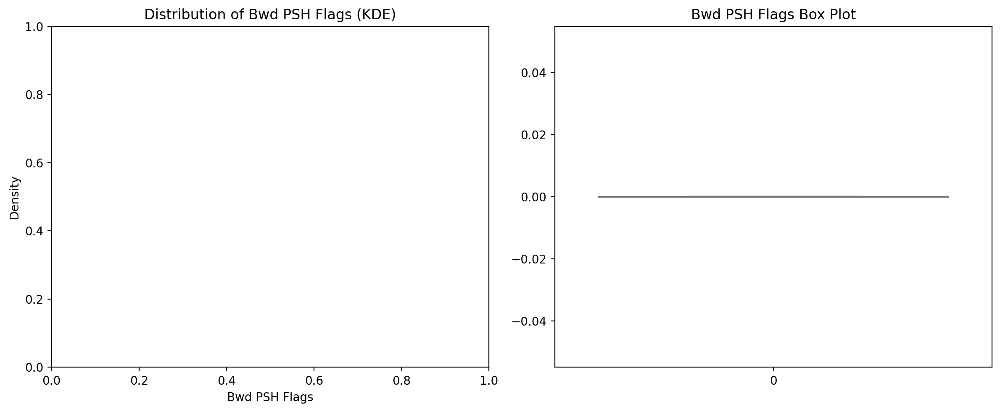


Analysis for Fwd URG Flags:


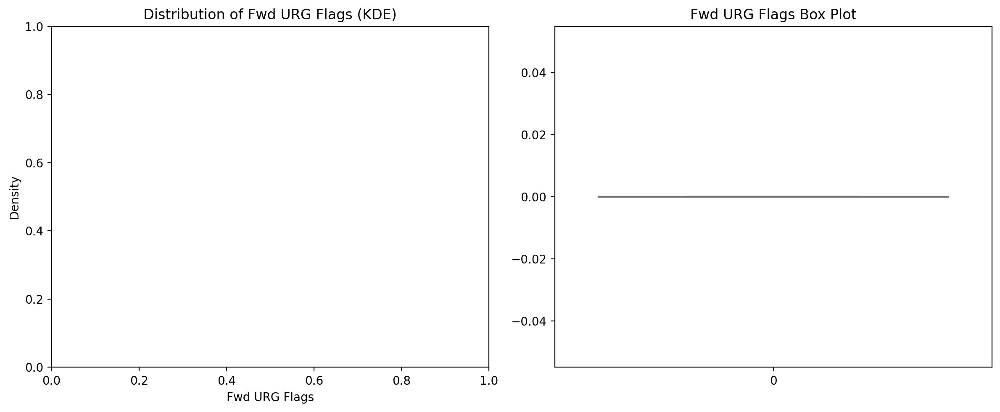


Analysis for Bwd URG Flags:


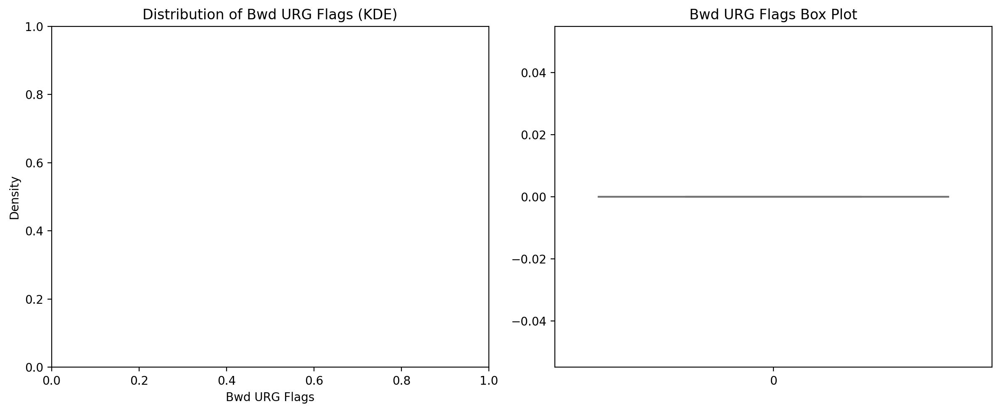


Analysis for Fwd Header Length:


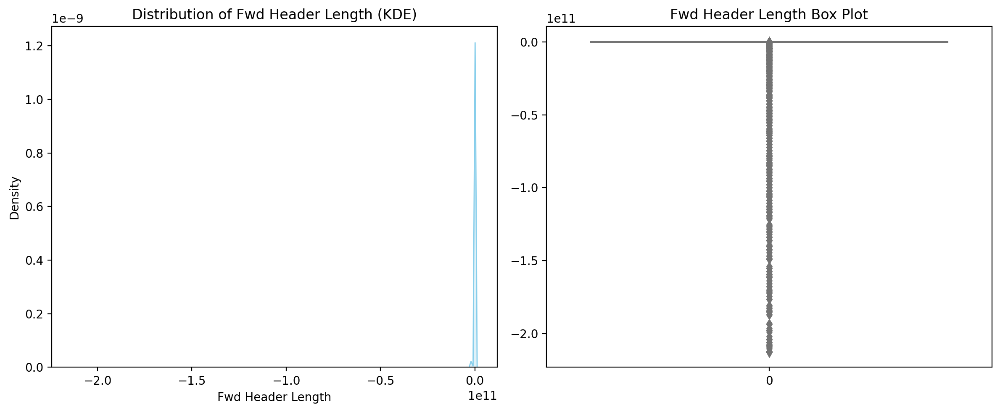


Analysis for Bwd Header Length:


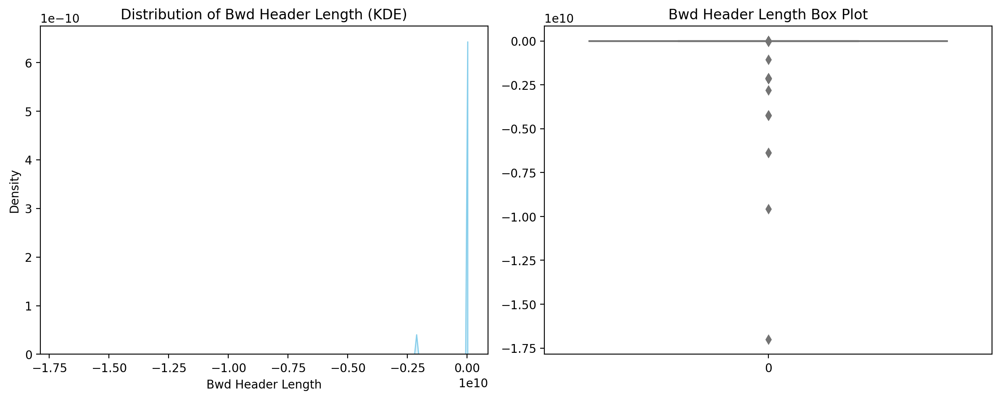


Analysis for Fwd Packets/s:


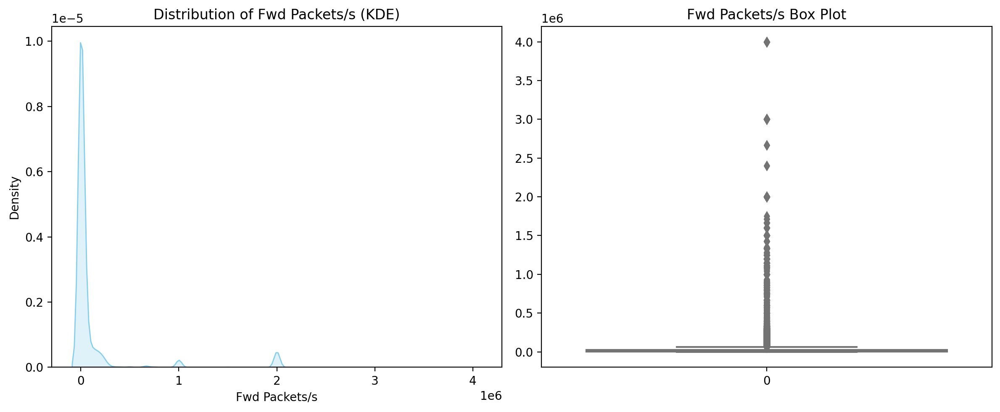


Analysis for Bwd Packets/s:


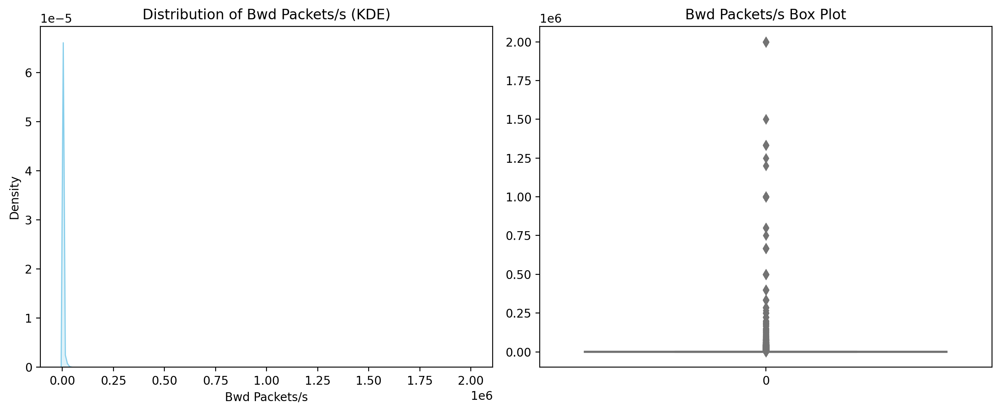


Analysis for Packet Length Min:


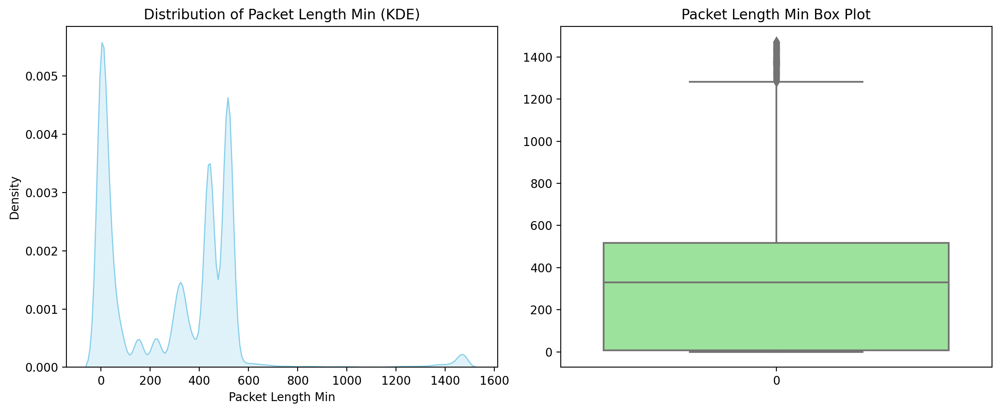


Analysis for Packet Length Max:


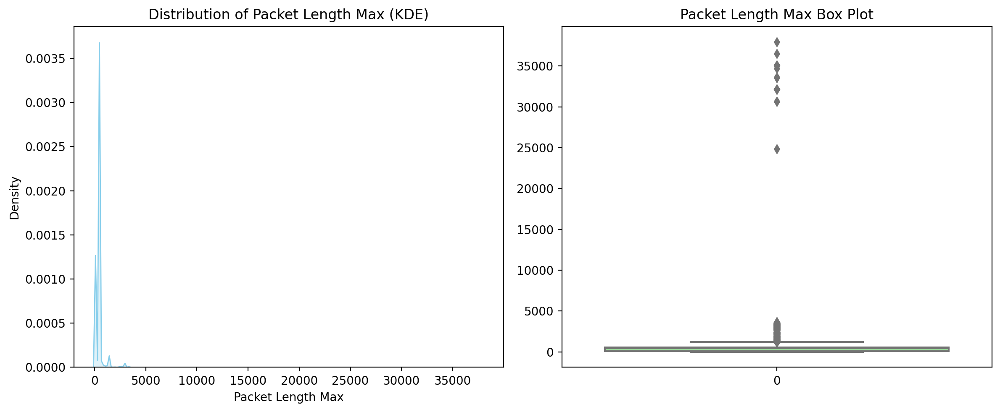


Analysis for Packet Length Mean:


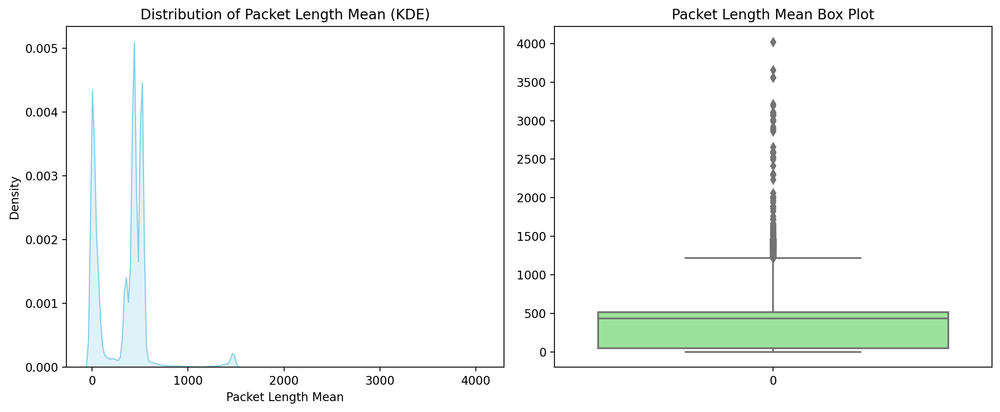


Analysis for Packet Length Std:


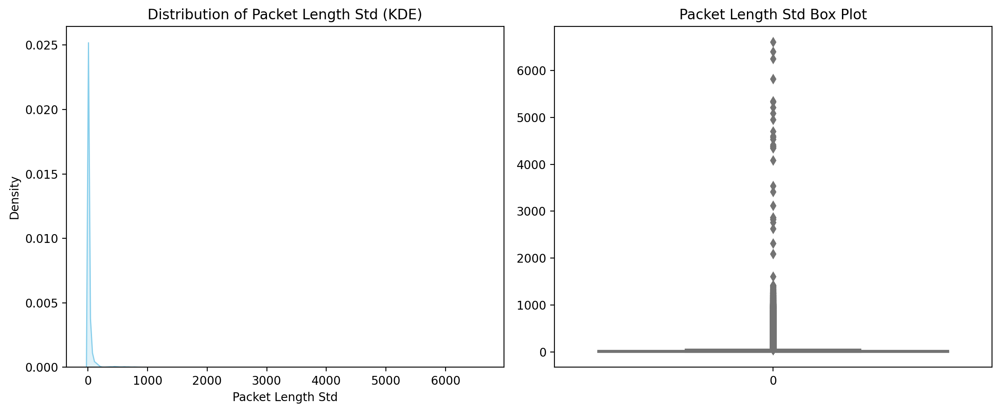


Analysis for Packet Length Variance:


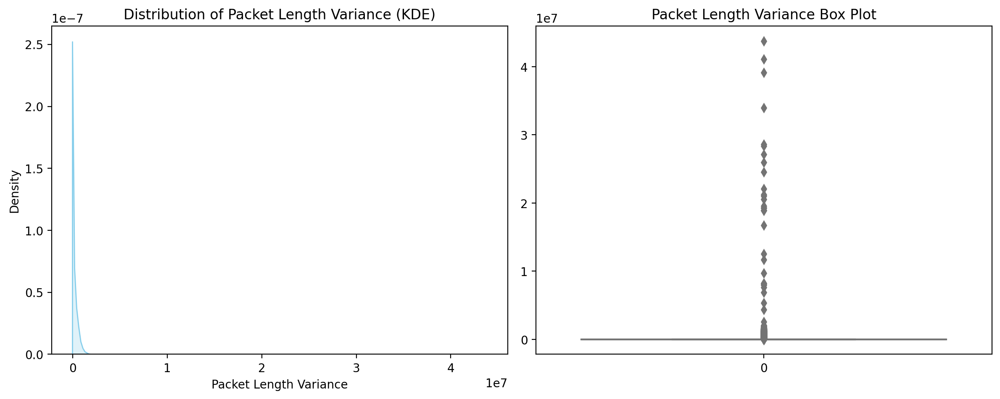


Analysis for FIN Flag Count:


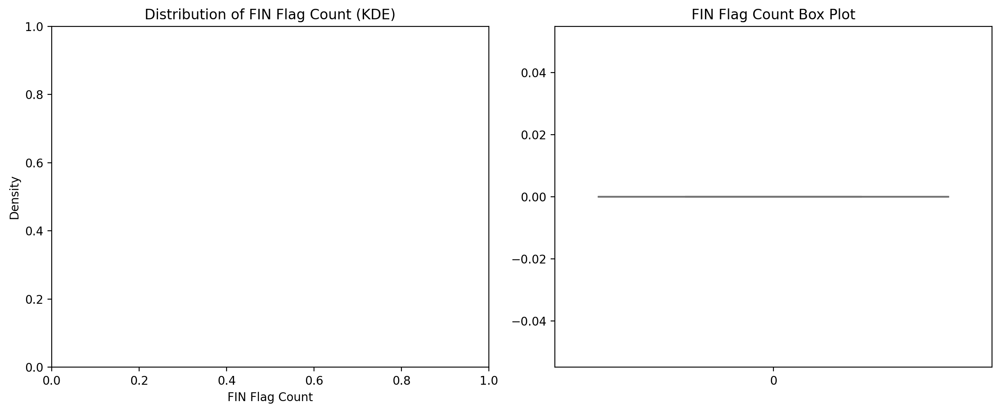


Analysis for SYN Flag Count:


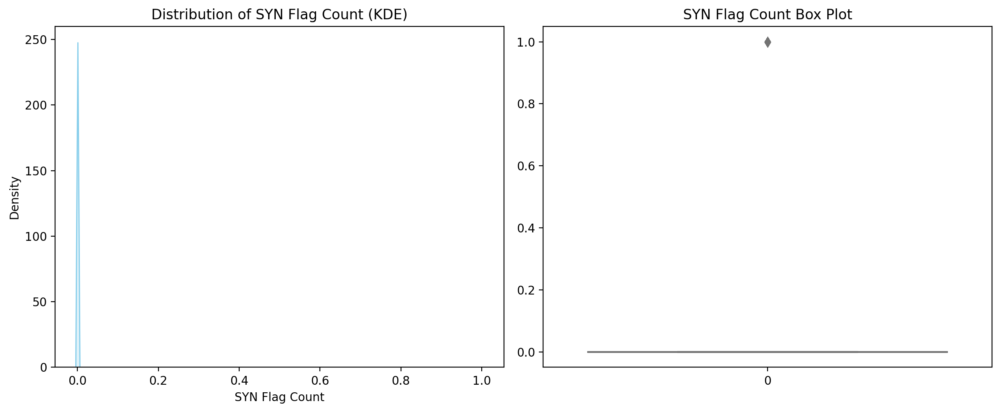


Analysis for RST Flag Count:


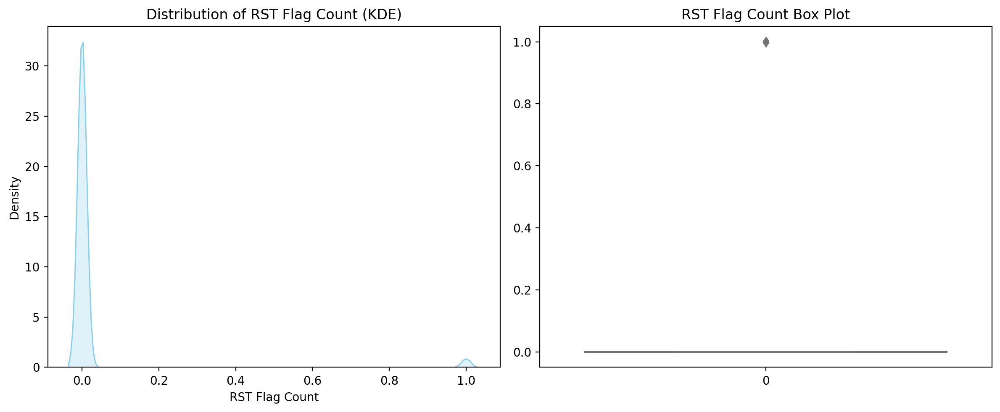


Analysis for PSH Flag Count:


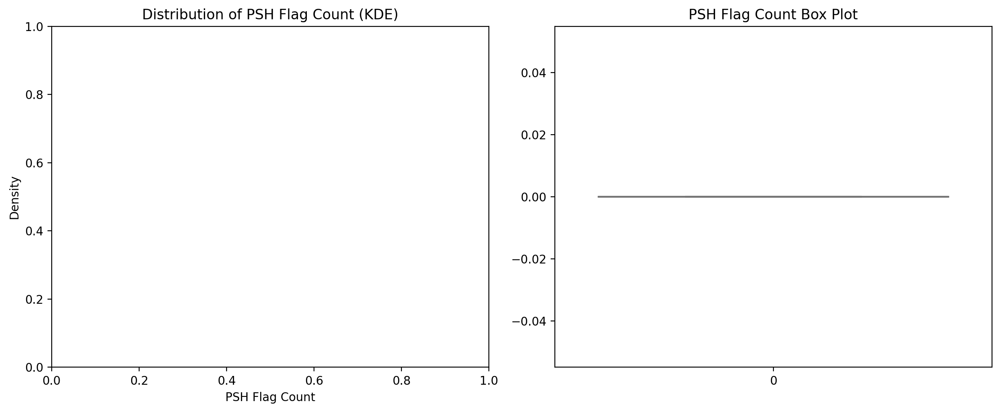


Analysis for ACK Flag Count:


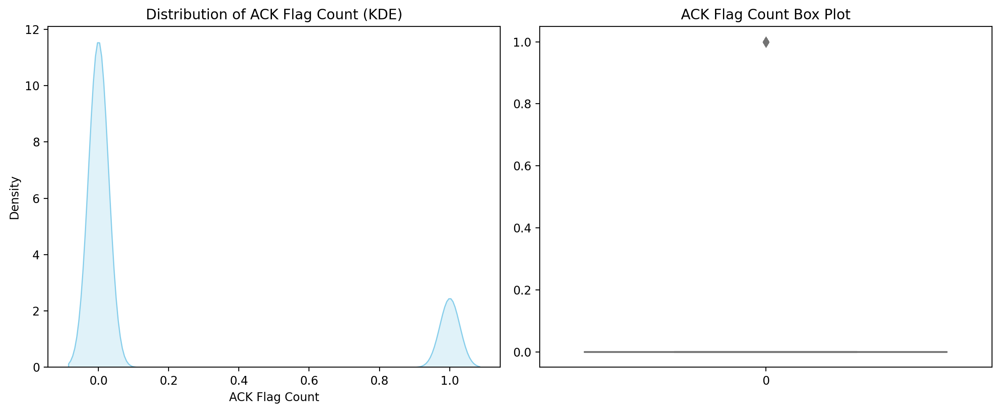


Analysis for URG Flag Count:


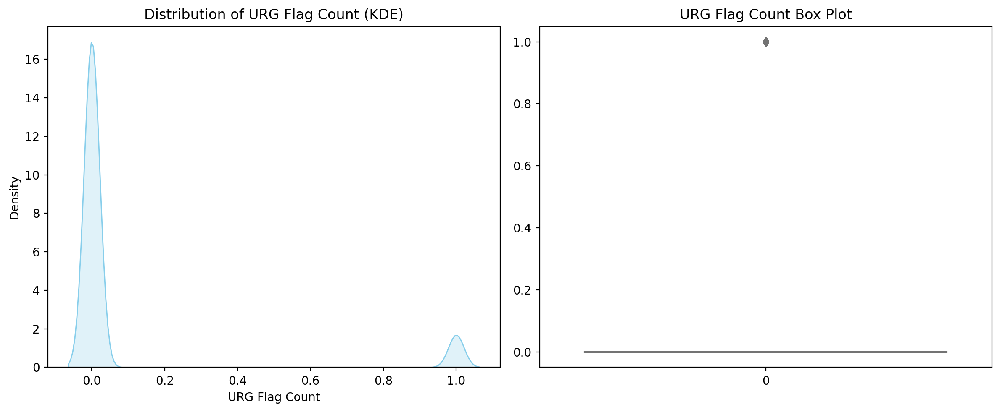


Analysis for CWE Flag Count:


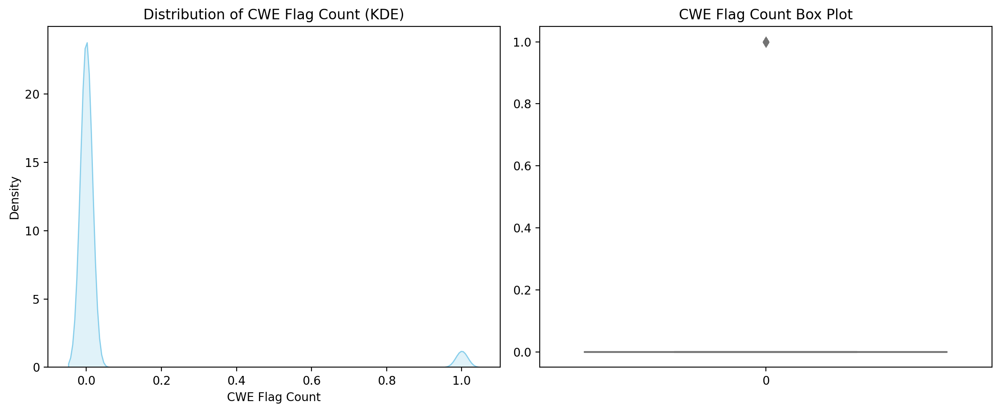


Analysis for ECE Flag Count:


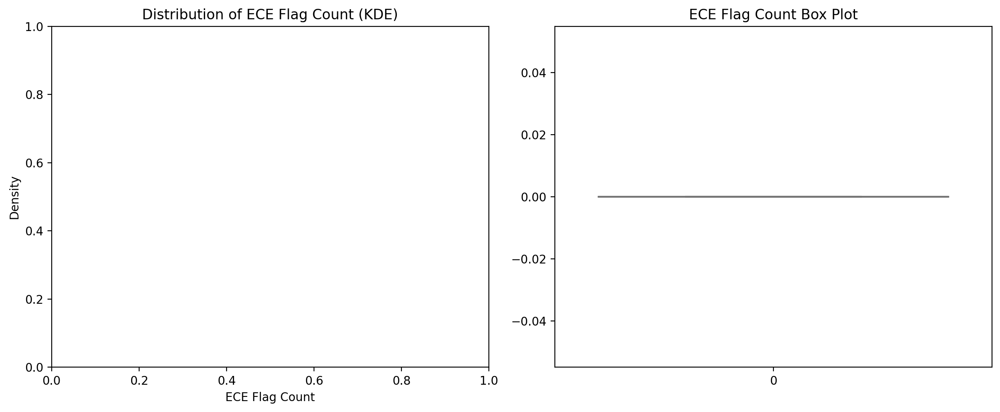


Analysis for Down/Up Ratio:


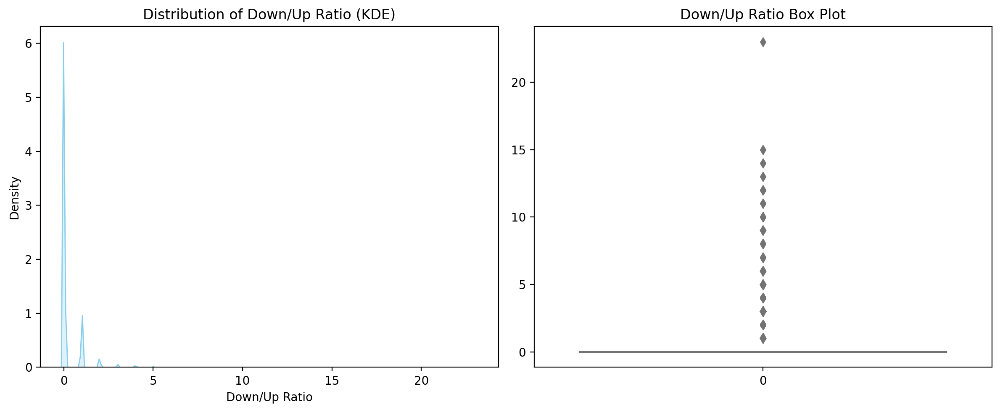


Analysis for Avg Packet Size:


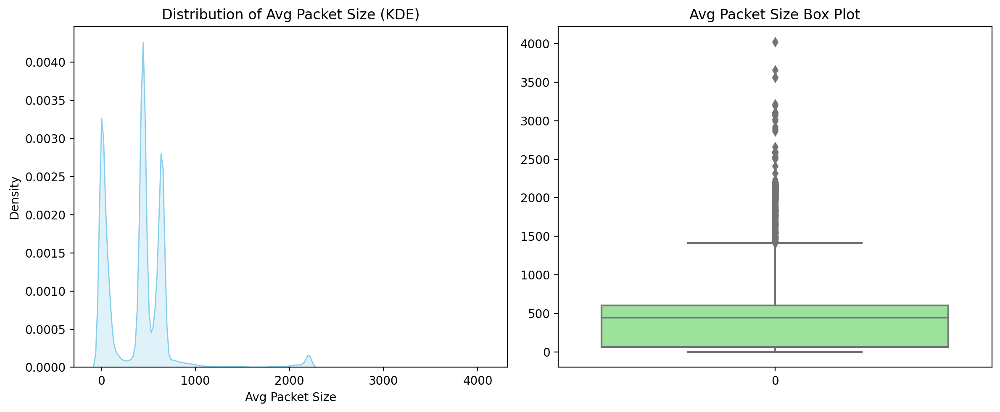


Analysis for Avg Fwd Segment Size:


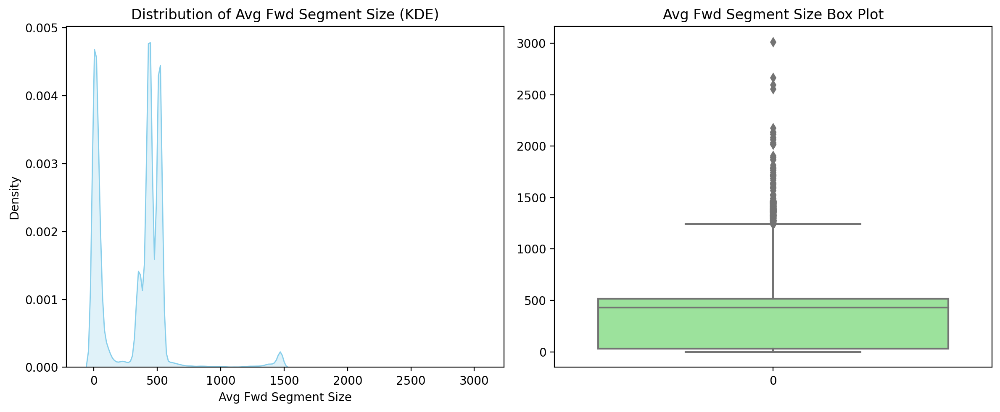


Analysis for Avg Bwd Segment Size:


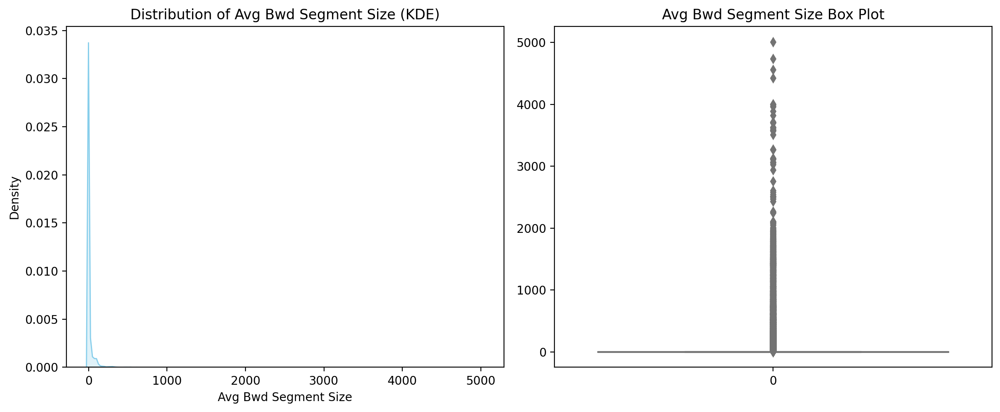


Analysis for Fwd Avg Bytes/Bulk:


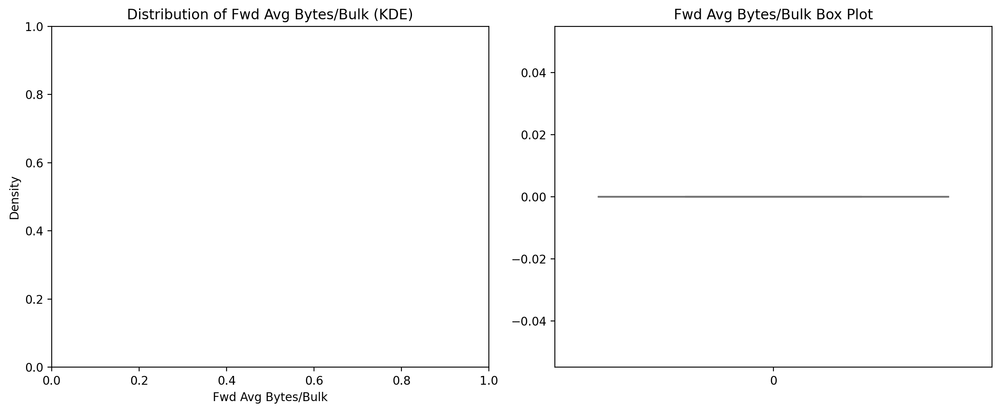


Analysis for Fwd Avg Packets/Bulk:


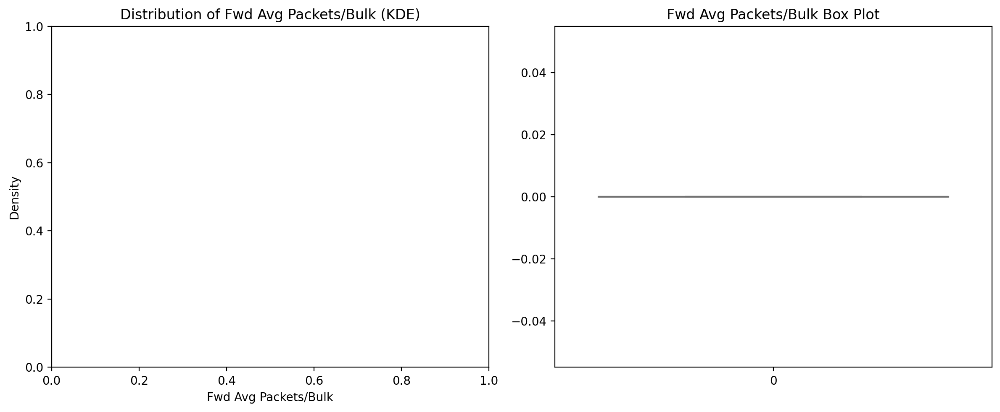


Analysis for Fwd Avg Bulk Rate:


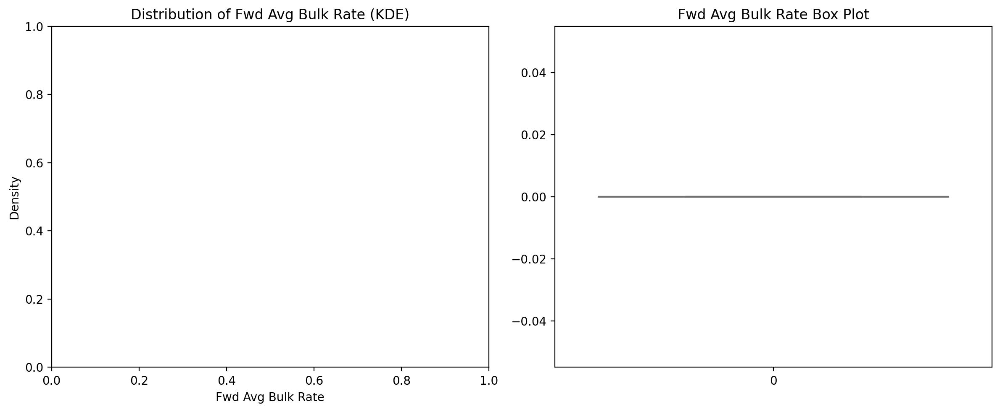


Analysis for Bwd Avg Bytes/Bulk:


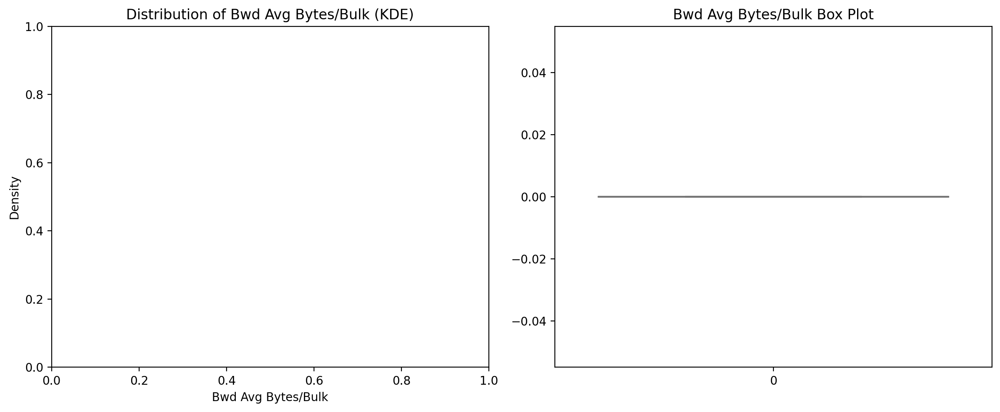


Analysis for Bwd Avg Packets/Bulk:


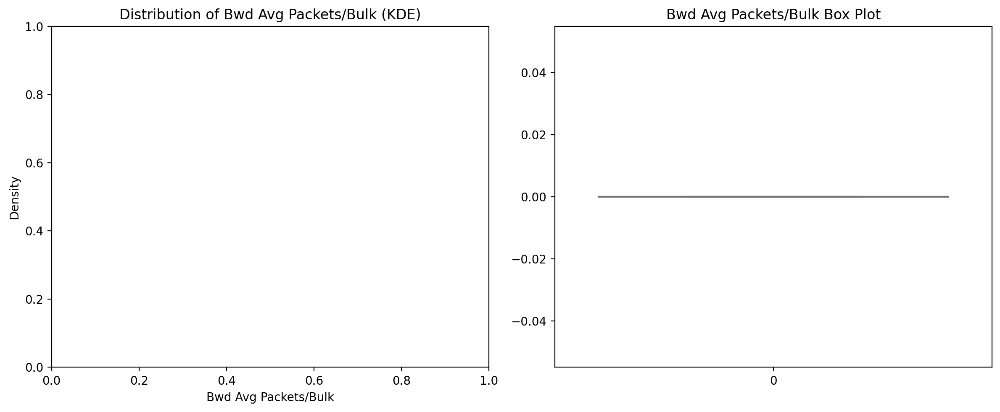


Analysis for Bwd Avg Bulk Rate:


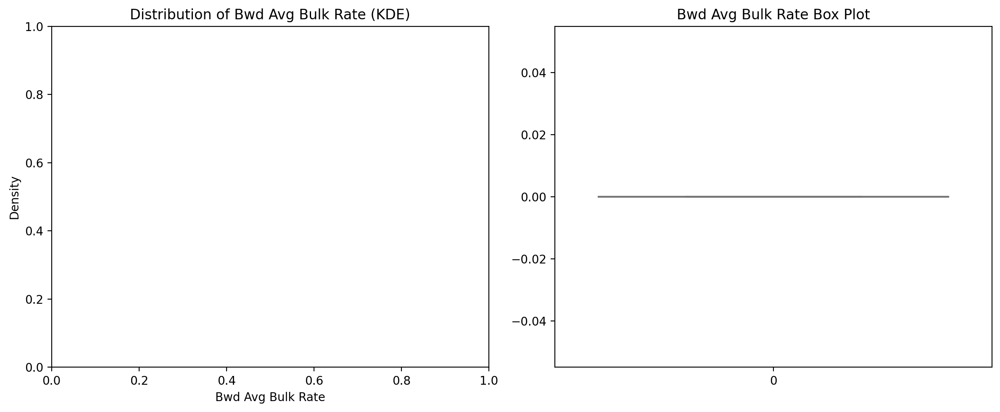


Analysis for Subflow Fwd Packets:


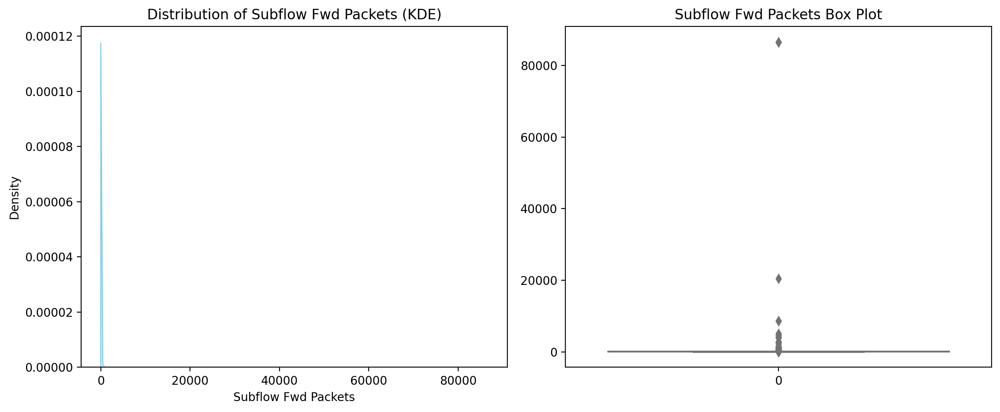


Analysis for Subflow Fwd Bytes:


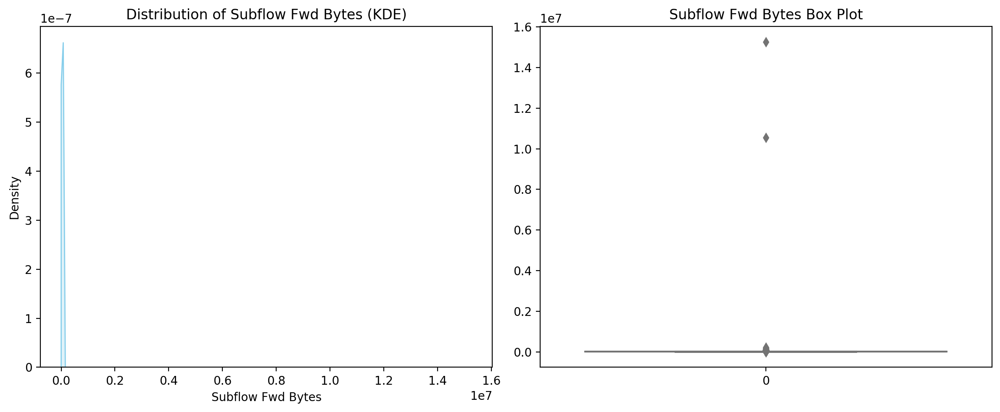


Analysis for Subflow Bwd Packets:


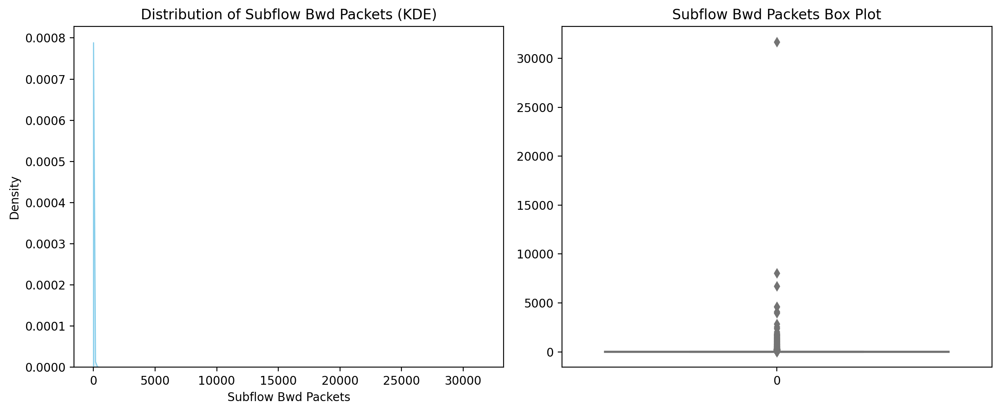


Analysis for Subflow Bwd Bytes:


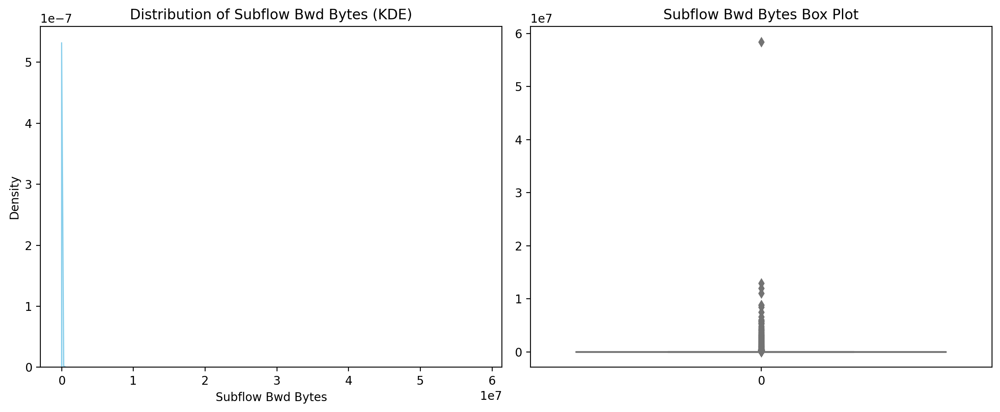


Analysis for Init Fwd Win Bytes:


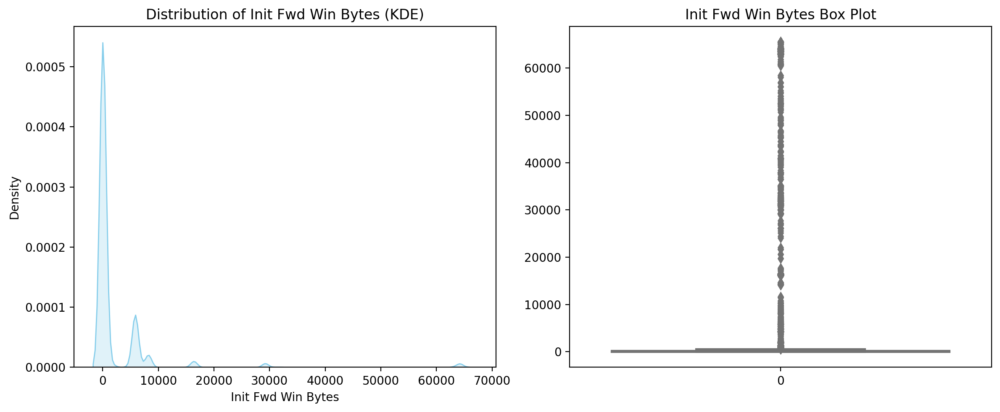


Analysis for Init Bwd Win Bytes:


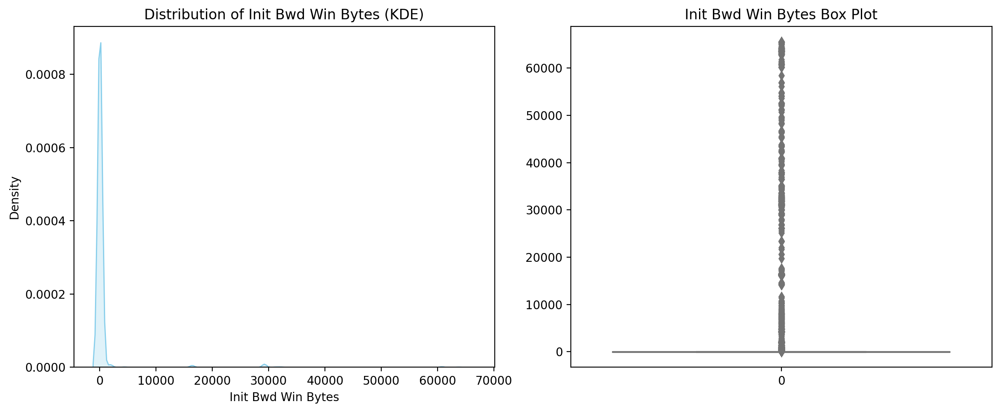


Analysis for Fwd Act Data Packets:


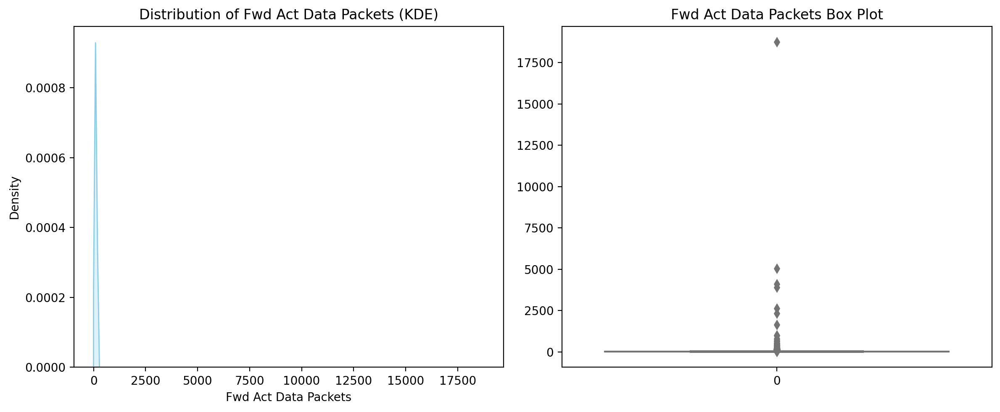


Analysis for Fwd Seg Size Min:


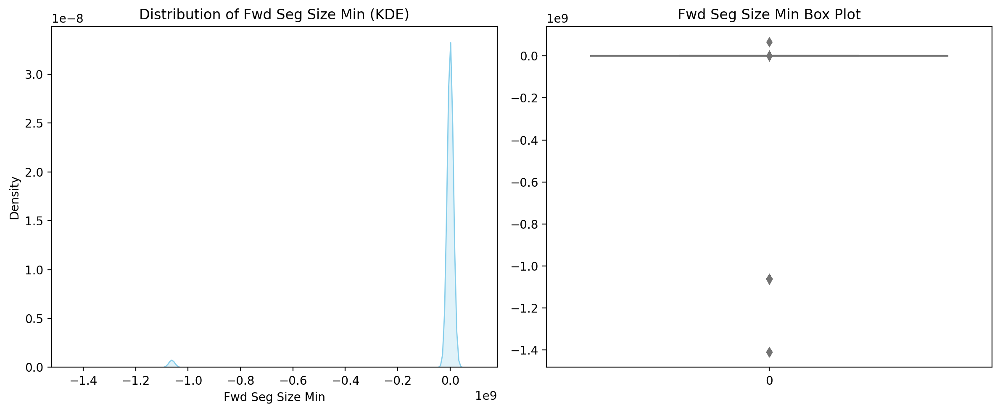


Analysis for Active Mean:


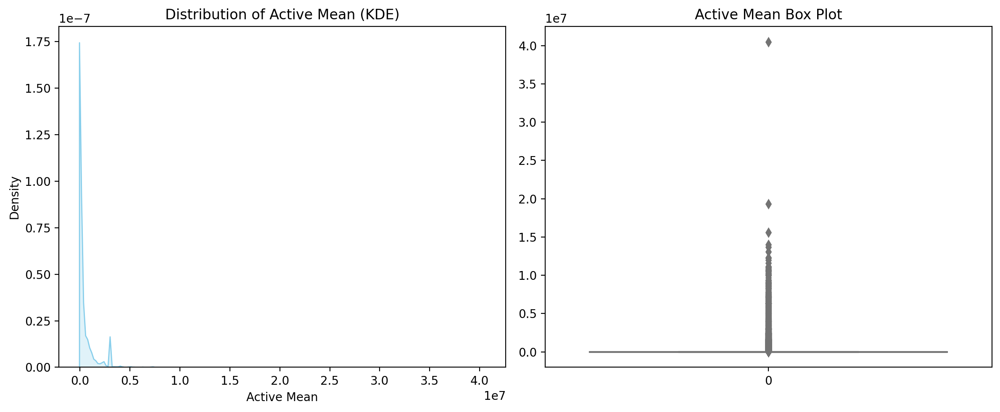


Analysis for Active Std:


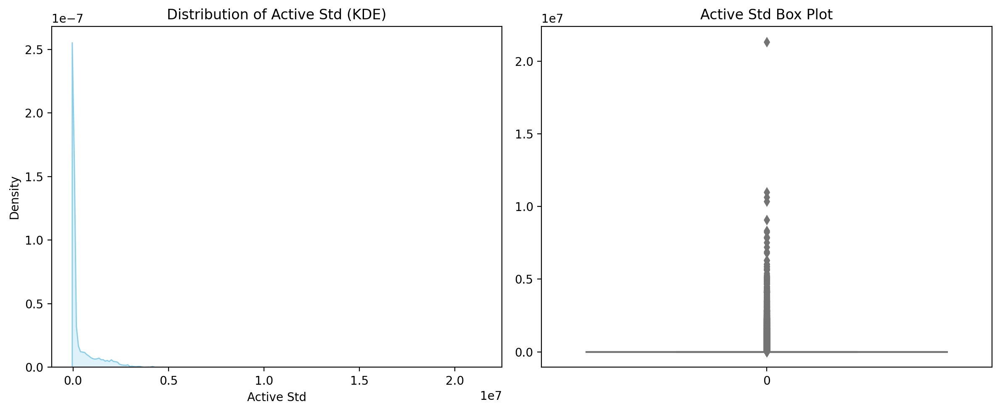


Analysis for Active Max:


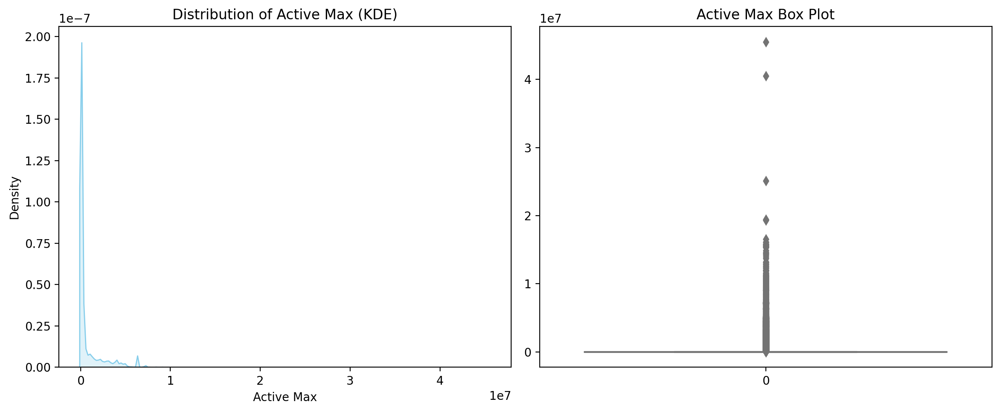


Analysis for Active Min:


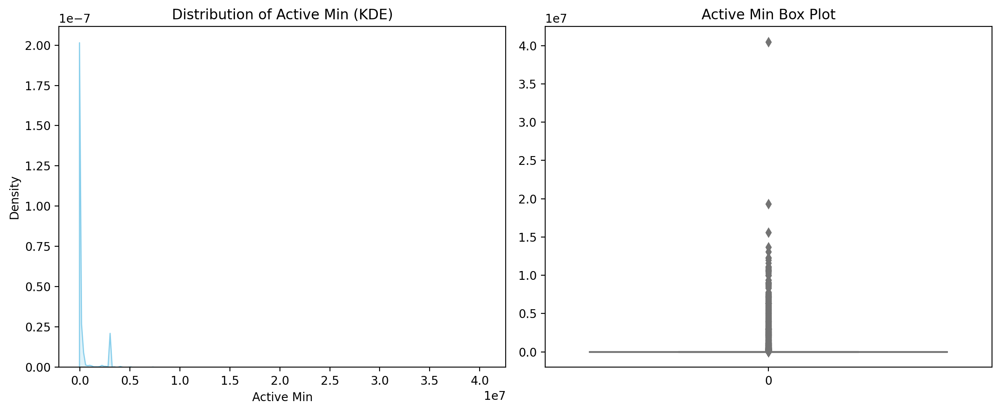


Analysis for Idle Mean:


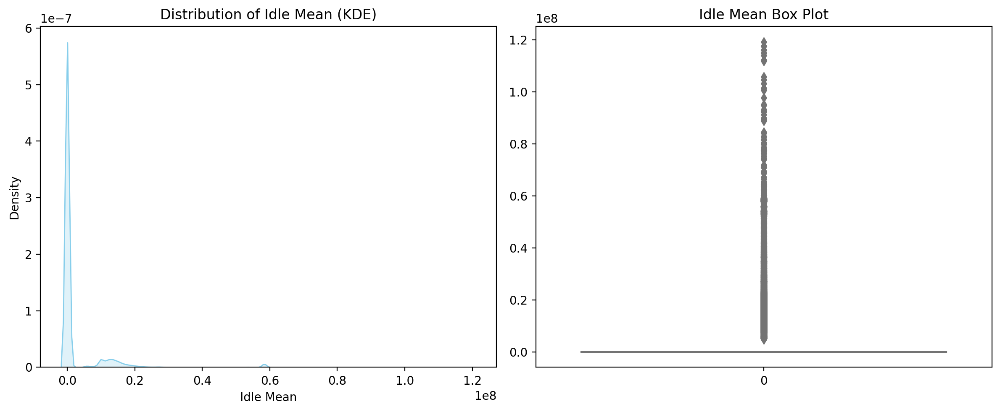


Analysis for Idle Std:


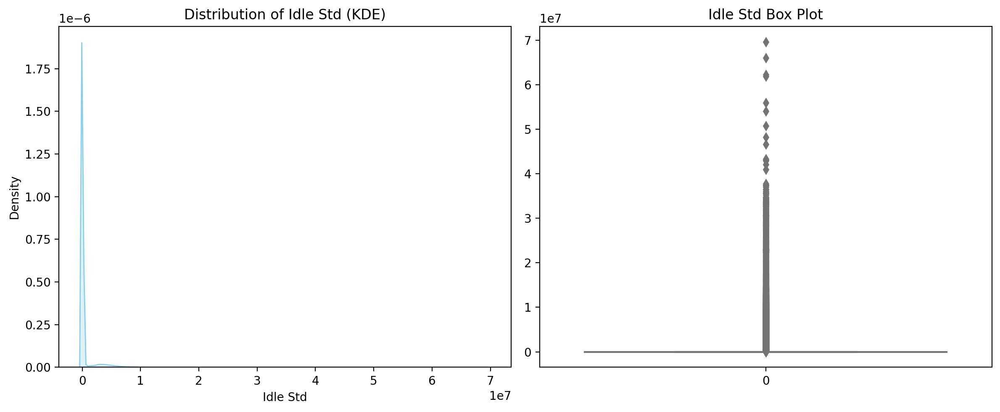


Analysis for Idle Max:


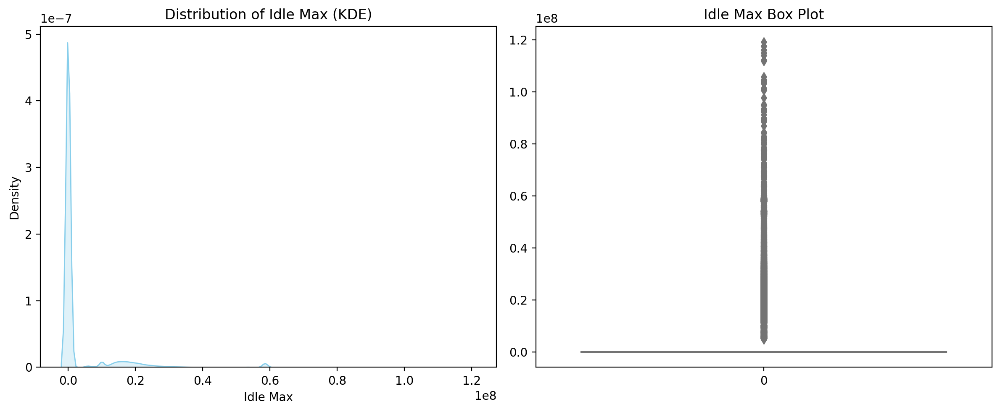


Analysis for Idle Min:


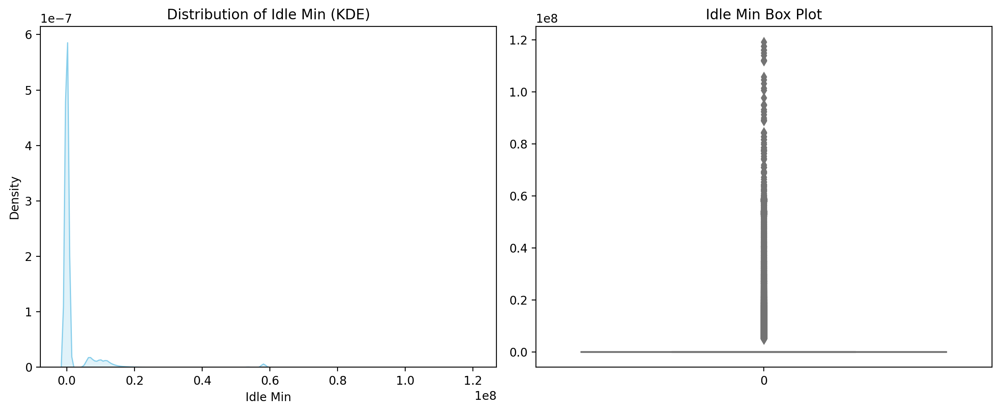


Skewness and Kurtosis Analysis:


,Skewness,Kurtosis,Minimum,Maximum,Q1,Q2,Q3,IQR,LLP,ULP
Protocol,-1.07,-0.79,0.00,17.00,6.00,17.00,17.00,11.00,-10.50,33.50
Flow Duration,3.25,10.98,1.00,119998742.00,855.00,46113.50,3002898.75,3002043.75,-4502210.62,7505964.38
Total Fwd Packets,401.19,175151.62,1.00,86666.00,4.00,5.00,16.00,12.00,-14.00,34.00
Total Backward Packets,426.98,230719.51,0.00,31700.00,0.00,0.00,2.00,2.00,-3.00,5.00
Fwd Packets Length Total,266.83,108261.80,0.00,15266416.00,84.00,2064.00,5280.00,5196.00,-7710.00,13074.00
Bwd Packets Length Total,401.42,209880.99,0.00,58429504.00,0.00,0.00,0.00,0.00,0.00,0.00
Fwd Packet Length Max,5.54,321.62,0.00,32120.00,38.00,440.00,516.00,478.00,-679.00,1233.00
Fwd Packet Length Min,1.23,3.69,0.00,2131.00,6.00,330.00,516.00,510.00,-759.00,1281.00
Fwd Packet Length Mean,1.07,3.74,0.00,3015.29,32.25,429.71,516.00,483.75,-693.38,1241.62
Fwd Packet Length Std,8.22,94.05,0.00,2221.56,0.00,0.00,0.00,0.00,0.00,0.00


In [28]:
# Apply the updated function to the specified columns
columns_to_check = [ 'Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count',
       'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count', 'Down/Up Ratio',
       'Avg Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size',
       'Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
       'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate',
       'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets',
       'Subflow Bwd Bytes', 'Init Fwd Win Bytes', 'Init Bwd Win Bytes',
       'Fwd Act Data Packets', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
       'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max',
       'Idle Min']
results = {}

for column in columns_to_check:
    print(f"\nAnalysis for {column}:")
    skew, kurt,mini,maxi,Q1,Q2,Q3,IQR,LLP,ULP = display_analysis_updated(column)
    if skew is not None and kurt is not None:
        results[column] = {'Skewness': skew, 'Kurtosis': kurt, 'Minimum': mini, 'Maximum': maxi, 'Q1': Q1, 'Q2': Q2, 'Q3': Q3, 'IQR': IQR, 'LLP': LLP, 'ULP': ULP}


results_df = pd.DataFrame(results).T
results_df.columns = ['Skewness', 'Kurtosis', 'Minimum', 'Maximum', 'Q1', 'Q2', 'Q3', 'IQR', 'LLP', 'ULP']
print("\nSkewness and Kurtosis Analysis:")
results_df

### 5.2 Categorical data Analysis

Unique values in 'Label': ['DrDoS_DNS' 'Benign' 'DrDoS_LDAP' 'NetBIOS' 'LDAP' 'DrDoS_MSSQL' 'MSSQL'
 'DrDoS_NetBIOS' 'DrDoS_NTP' 'Portmap' 'DrDoS_SNMP' 'Syn' 'TFTP'
 'DrDoS_UDP' 'UDP' 'UDP-lag' 'WebDDoS' 'UDPLag']
Number of unique values in 'Label': 18


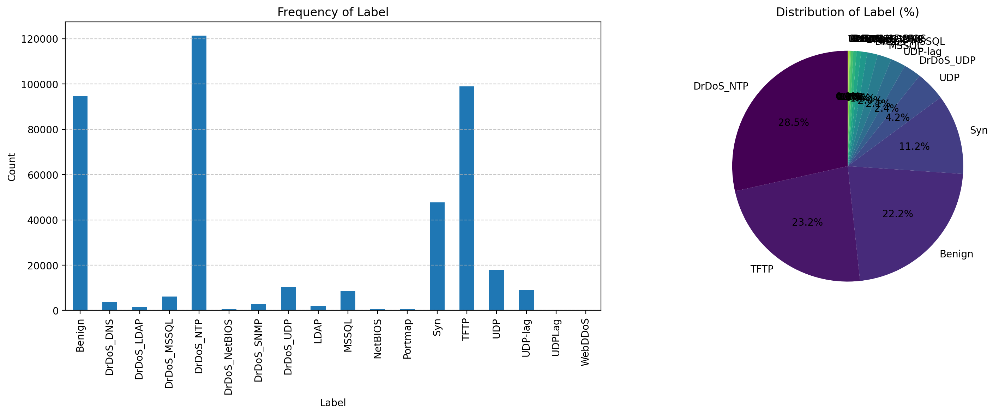

In [33]:
# List of columns to analyze
columns_to_plot = ['Label']

# Loop through each column and plot the distribution
for column in columns_to_plot:
    plot_column_distribution(df, column)

## 6. Feature Engineering

## correlation matrix

In [34]:
# Select only numeric columns (int and float)
numeric_df = df.select_dtypes(include=[float, int])
# Compute the correlation matrix
correlation_matrix = numeric_df.corr()
display(correlation_matrix)
## correlation can be found only for numerical data present in the dataset, strings and objects are not suitable for correlation.

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Protocol,1.00,-0.56,0.03,-0.06,0.15,-0.02,0.43,0.65,0.68,-0.17,-0.23,0.09,-0.20,-0.27,0.13,0.09,-0.49,-0.52,-0.51,-0.01,-0.56,-0.53,-0.53,-0.51,-0.01,-0.37,-0.37,-0.38,-0.38,-0.18,-0.26,NaN,NaN,NaN,-0.03,-0.01,0.09,-0.08,0.65,0.13,0.64,-0.23,-0.11,NaN,-0.03,-0.26,NaN,-0.75,-0.51,-0.36,NaN,-0.33,0.58,0.68,-0.20,NaN,NaN,NaN,NaN,NaN,NaN,0.03,0.15,-0.06,-0.02,-0.49,-0.24,0.17,-0.09,-0.15,-0.18,-0.20,-0.09,-0.51,-0.41,-0.54,-0.45
Flow Duration,-0.56,1.00,-0.01,0.10,-0.09,0.03,-0.10,-0.35,-0.35,0.21,0.28,-0.07,0.19,0.29,-0.09,-0.12,0.67,0.78,0.86,0.02,1.00,0.76,0.81,0.86,0.02,0.79,0.57,0.64,0.72,0.03,0.02,NaN,NaN,NaN,0.02,0.01,-0.12,-0.02,-0.35,0.09,-0.33,0.24,0.09,NaN,-0.01,0.02,NaN,0.66,-0.06,-0.09,NaN,-0.06,-0.30,-0.35,0.19,NaN,NaN,NaN,NaN,NaN,NaN,-0.01,-0.09,0.10,0.03,0.31,-0.01,-0.07,0.04,0.20,0.32,0.32,0.08,0.84,0.56,0.87,0.77
Total Fwd Packets,0.03,-0.01,1.00,0.18,0.17,0.17,0.04,0.02,0.03,0.01,0.02,-0.03,0.02,0.01,-0.02,-0.02,-0.04,-0.04,-0.02,-0.00,-0.01,-0.04,-0.03,-0.01,-0.00,0.01,-0.01,-0.01,0.00,-0.02,-0.01,NaN,NaN,NaN,-0.02,0.00,-0.01,-0.01,0.02,0.04,0.03,0.02,0.02,NaN,-0.00,-0.01,NaN,-0.03,-0.03,-0.03,NaN,-0.04,0.01,0.03,0.02,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.17,0.18,0.17,-0.01,-0.01,0.28,0.01,0.00,0.00,0.01,0.00,-0.00,-0.01,-0.01,-0.00
Total Backward Packets,-0.06,0.10,0.18,1.00,0.03,0.97,0.06,-0.05,-0.04,0.08,0.23,0.00,0.22,0.17,-0.01,-0.01,0.00,0.03,0.10,-0.00,0.10,0.02,0.04,0.09,-0.00,0.12,0.03,0.05,0.10,0.00,0.01,NaN,NaN,NaN,0.00,-0.00,-0.01,0.00,-0.05,0.19,0.02,0.20,0.21,NaN,-0.00,0.01,NaN,0.07,0.00,-0.00,NaN,0.05,0.01,-0.04,0.22,NaN,NaN,NaN,NaN,NaN,NaN,0.18,0.03,1.00,0.97,0.08,0.01,0.51,0.01,0.07,0.06,0.08,0.05,0.10,0.03,0.09,0.10
Fwd Packets Length Total,0.15,-0.09,0.17,0.03,1.00,0.00,0.25,0.10,0.14,0.04,-0.02,-0.07,-0.04,-0.02,-0.02,-0.02,-0.12,-0.12,-0.10,-0.00,-0.09,-0.12,-0.12,-0.09,-0.00,-0.04,-0.06,-0.06,-0.05,-0.05,-0.04,NaN,NaN,NaN,-0.05,0.00,-0.02,-0.01,0.10,0.13,0.13,0.00,0.03,NaN,-0.01,-0.04,NaN,-0.11,-0.08,-0.06,NaN,-0.10,0.06,0.14,-0.04,NaN,NaN,NaN,NaN,NaN,NaN,0.17,1.00,0.03,0.00,-0.07,-0.03,0.61,0.01,-0.02,-0.02,-0.02,-0.01,-0.07,-0.06,-0.08,-0.06
Bwd Packets Length Total,-0.02,0.03,0.17,0.97,0.00,1.00,0.03,-0.02,-0.02,0.03,0.26,-0.00,0.21,0.17,-0.00,-0.00,-0.01,0.00,0.04,-0.00,0.03,-0.00,0.01,0.04,-0.00,0.04,-0.00,0.01,0.04,-0.00,-0.00,NaN,NaN,NaN,0.00,-0.00,-0.00,-0.00,-0.02,0.23,0.05,0.19,0.34,NaN,-0.00,-0.00,NaN,0.03,-0.00,-0.00,NaN,0.03,0.03,-0.02,0.21,NaN,NaN,NaN,NaN,NaN,NaN,0.17,0.00,0.97,1.00,0.05,0.00,0.49,0.00,0.04,0.02,0.03,0.03,0.04,0.01,0.03,0.04
Fwd Packet Length Max,0.43,-0.10,0.04,0.06,0.25,0.03,1.00,0.70,0.81,0.49,0.22,-0.26,0.12,0.25,0.41,0.25,-0.27,-0.22,-0.10,-0.01,-0.10,-0.28,-0.19,-0.10,-0.01,0.09,-0.17,-0.12,-0.02,-0.18,-0.11,NaN,NaN,NaN,-0.01,

## Correlation between the different features

<Axes: >

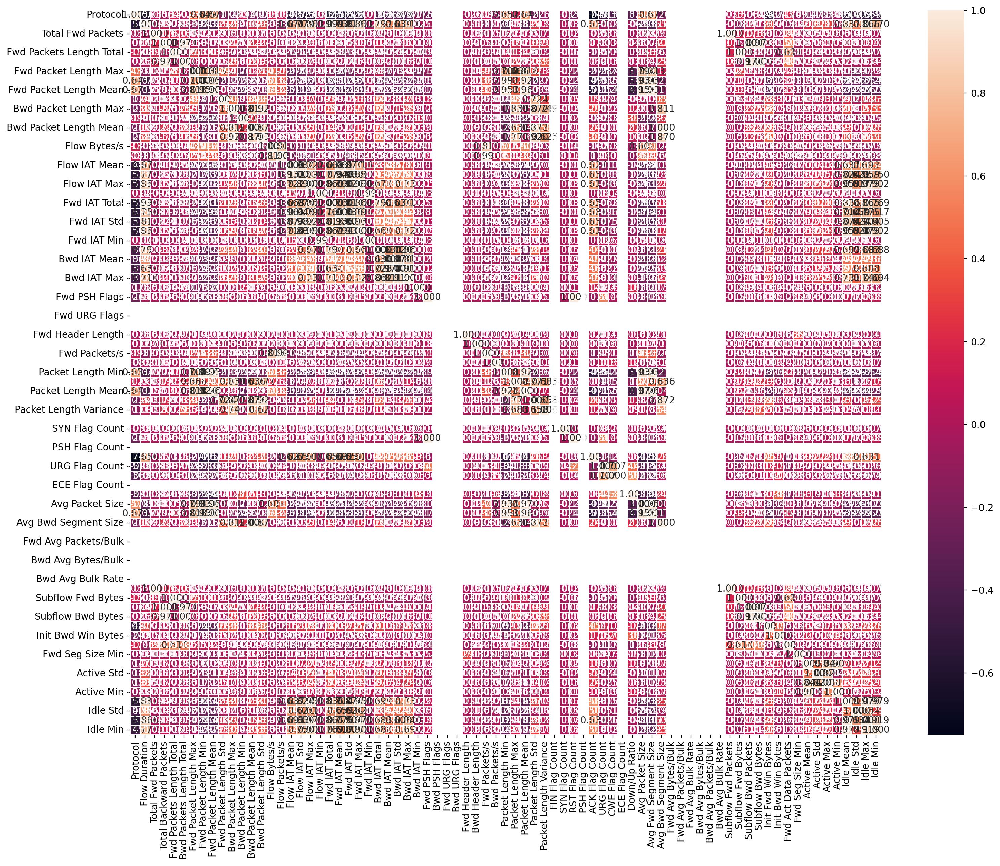

In [35]:
corr = df[['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count',
       'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count', 'Down/Up Ratio',
       'Avg Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size',
       'Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
       'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate',
       'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets',
       'Subflow Bwd Bytes', 'Init Fwd Win Bytes', 'Init Bwd Win Bytes',
       'Fwd Act Data Packets', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
       'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max',
       'Idle Min']].corr()
f, ax = plt.subplots(figsize = (18,14))
sns.heatmap(corr, annot=True, fmt=".3f", linewidths=0.5, ax=ax)

In [36]:
# Features with a single unique value
single_val_cols = [col for col in df.columns if df[col].nunique() == 1]
single_val_cols


['Bwd PSH Flags',
 'Fwd URG Flags',
 'Bwd URG Flags',
 'FIN Flag Count',
 'PSH Flag Count',
 'ECE Flag Count',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

In [37]:
# Remove columns with a single unique value
df.drop(single_val_cols, axis=1, inplace = True)

In [38]:
df.shape

(426054, 66)

In [39]:
# Select only numeric columns
numerical_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr_matrix = numerical_df.corr().abs()

# Generate a boolean mask for the upper triangle
mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)

# Select the upper triangle of the correlation matrix
upper_triangle = corr_matrix.where(mask)

# Find the columns with correlation of 0.8 or higher
high_corr_cols = [col for col in upper_triangle.columns if any(upper_triangle[col] > 0.8)]

# Display the number of highly correlated columns and their names
print(f"Total number of highly correlated columns: {len(high_corr_cols)}")
print("Highly correlated columns are:", high_corr_cols)

Total number of highly correlated columns: 32
Highly correlated columns are: ['Bwd Packets Length Total', 'Fwd Packet Length Mean', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Packets/s', 'Flow IAT Std', 'Flow IAT Max', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Std', 'Bwd IAT Max', 'Fwd Packets/s', 'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std', 'RST Flag Count', 'Avg Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size', 'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'Active Max', 'Active Min', 'Idle Mean', 'Idle Max', 'Idle Min']


In [40]:
df.drop(high_corr_cols, axis=1, inplace=True)

In [41]:
df.shape

(426054, 34)

## Label encoding

In [45]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import pickle
import os

# Assuming 'df' is your DataFrame
# Ensure the Label column exists
if 'Label' not in df.columns:
    raise ValueError("The 'Label' column is missing from the dataset.")

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'Label' column
df['Encoded_Label'] = label_encoder.fit_transform(df['Label'])

# Print the mapping
print("Label Encoding Mapping:")
for category, label in zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)):
    print(f"{category} -> {label}")

# Save the LabelEncoder to a .pkl file
os.makedirs("../models", exist_ok=True)
model_path = os.path.join("../models", "label_encoder.pkl")

with open(model_path, "wb") as file:
    pickle.dump(label_encoder, file)

print(f"Label encoder saved at: {model_path}")




Label Encoding Mapping:
Benign -> 0
DrDoS_DNS -> 1
DrDoS_LDAP -> 2
DrDoS_MSSQL -> 3
DrDoS_NTP -> 4
DrDoS_NetBIOS -> 5
DrDoS_SNMP -> 6
DrDoS_UDP -> 7
LDAP -> 8
MSSQL -> 9
NetBIOS -> 10
Portmap -> 11
Syn -> 12
TFTP -> 13
UDP -> 14
UDP-lag -> 15
UDPLag -> 16
WebDDoS -> 17
Label encoder saved at: ../models\label_encoder.pkl


In [46]:
df.head()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Flow Bytes/s,Flow IAT Mean,Flow IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Min,Fwd PSH Flags,Fwd Header Length,Bwd Header Length,Bwd Packets/s,Packet Length Variance,SYN Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,Down/Up Ratio,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Idle Std,Label,Encoded_Label
0,17,48,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,61333333.33,48.00,48.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,0,0.00,0.00,0.00,DrDoS_DNS,1
1,17,2,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,1472000000.00,2.00,2.00,0.00,0.00,0.00,0,-2,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,-1,0.00,0.00,0.00,DrDoS_DNS,1
2,17,1,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,2944000000.00,1.00,1.00,0.00,0.00,0.00,0,-2,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,-1,0.00,0.00,0.00,DrDoS_DNS,1
3,17,1,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,2944000000.00,1.00,1.00,0.00,0.00,0.00,0,2960,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,1480,0.00,0.00,0.00,DrDoS_DNS,1
4,17,1,2,0,2896.00,1448.00,1448.00,0.00,0.00,0.00,2896000000.00,1.00,1.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,0,0.00,0.00,0.00,DrDoS_DNS,1


#### before Splitting we should convert data from float into integer

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 426054 entries, 0 to 431370
Data columns (total 35 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Protocol                  426054 non-null  int64  
 1   Flow Duration             426054 non-null  int64  
 2   Total Fwd Packets         426054 non-null  int64  
 3   Total Backward Packets    426054 non-null  int64  
 4   Fwd Packets Length Total  426054 non-null  float64
 5   Fwd Packet Length Max     426054 non-null  float64
 6   Fwd Packet Length Min     426054 non-null  float64
 7   Fwd Packet Length Std     426054 non-null  float64
 8   Bwd Packet Length Max     426054 non-null  float64
 9   Bwd Packet Length Min     426054 non-null  float64
 10  Flow Bytes/s              426054 non-null  float64
 11  Flow IAT Mean             426054 non-null  float64
 12  Flow IAT Min              426054 non-null  float64
 13  Bwd IAT Total             426054 non-null  float6

## 7. Feature Standartization

### Splitting

In [48]:
from sklearn.model_selection import train_test_split

# Assuming 'data' is your dataset and you want to split it into features (X) and labels (y)
X = df.drop(columns=['Encoded_Label', 'Label']) 
y = df['Encoded_Label']

# Split the data (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [62]:
df.head()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Flow Bytes/s,Flow IAT Mean,Flow IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Min,Fwd PSH Flags,Fwd Header Length,Bwd Header Length,Bwd Packets/s,Packet Length Variance,SYN Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,Down/Up Ratio,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Idle Std,Label,Encoded_Label
0,17,48,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,61333333.33,48.00,48.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,0,0.00,0.00,0.00,DrDoS_DNS,1
1,17,2,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,1472000000.00,2.00,2.00,0.00,0.00,0.00,0,-2,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,-1,0.00,0.00,0.00,DrDoS_DNS,1
2,17,1,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,2944000000.00,1.00,1.00,0.00,0.00,0.00,0,-2,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,-1,0.00,0.00,0.00,DrDoS_DNS,1
3,17,1,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,2944000000.00,1.00,1.00,0.00,0.00,0.00,0,2960,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,1480,0.00,0.00,0.00,DrDoS_DNS,1
4,17,1,2,0,2896.00,1448.00,1448.00,0.00,0.00,0.00,2896000000.00,1.00,1.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,0,0.00,0.00,0.00,DrDoS_DNS,1


In [64]:
X.head()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Flow Bytes/s,Flow IAT Mean,Flow IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Min,Fwd PSH Flags,Fwd Header Length,Bwd Header Length,Bwd Packets/s,Packet Length Variance,SYN Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,Down/Up Ratio,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Idle Std
0,17,48,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,61333333.33,48.00,48.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,0,0.00,0.00,0.00
1,17,2,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,1472000000.00,2.00,2.00,0.00,0.00,0.00,0,-2,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,-1,0.00,0.00,0.00
2,17,1,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,2944000000.00,1.00,1.00,0.00,0.00,0.00,0,-2,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,-1,0.00,0.00,0.00
3,17,1,2,0,2944.00,1472.00,1472.00,0.00,0.00,0.00,2944000000.00,1.00,1.00,0.00,0.00,0.00,0,2960,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,1480,0.00,0.00,0.00
4,17,1,2,0,2896.00,1448.00,1448.00,0.00,0.00,0.00,2896000000.00,1.00,1.00,0.00,0.00,0.00,0,0,0,0.00,0.00,0,0,0,0,0.00,-1,-1,1,0,0.00,0.00,0.00


In [63]:
df.columns

Index(['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Flow Bytes/s', 'Flow IAT Mean',
       'Flow IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Min',
       'Fwd PSH Flags', 'Fwd Header Length', 'Bwd Header Length',
       'Bwd Packets/s', 'Packet Length Variance', 'SYN Flag Count',
       'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'Down/Up Ratio',
       'Init Fwd Win Bytes', 'Init Bwd Win Bytes', 'Fwd Act Data Packets',
       'Fwd Seg Size Min', 'Active Mean', 'Active Std', 'Idle Std', 'Label',
       'Encoded_Label'],
      dtype='object')

In [61]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: Encoded_Label, dtype: int32

### Saving Splitting Data

In [49]:
# Save the training feature set
X_train.to_csv('../data/X_train.csv', index=False)  # Save features
y_train.to_csv('../data/y_train.csv', index=False)  # Save target variable
# Save the testing feature set
X_test.to_csv('../data/X_test.csv', index=False)    # Save features
y_test.to_csv('../data/y_test.csv', index=False)     # Save target variable

### Print Saving Data

In [50]:
# Display the shape of the resulting datasets
print(f'X Train features shape: {X_train.shape}')
print(f'X Test features shape: {X_test.shape}')
print(f'y Train target shape: {y_train.shape}')
print(f'y Test target shape: {y_test.shape}')

X Train features shape: (340843, 33)
X Test features shape: (85211, 33)
y Train target shape: (340843,)
y Test target shape: (85211,)


In [51]:
# Feature Scaling using MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [52]:
with open("../models/minmaxscaler.pkl", "wb") as file:
    pickle.dump(scaler, file)

## 8. Algorithms Applying

In [54]:
import numpy as np
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

from catboost import CatBoostClassifier



## XGBoost Classifier

Training XGBoost...
XGBoost Results:
Accuracy: 0.9379
F1 Score: 0.9302

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19027
           1       0.60      0.49      0.54       739
           2       0.34      0.23      0.28       264
           3       0.41      0.22      0.29      1242
           4       1.00      1.00      1.00     24312
           5       0.30      0.13      0.18       131
           6       0.58      0.77      0.66       541
           7       0.64      0.07      0.13      2108
           8       0.43      0.41      0.42       370
           9       0.52      0.77      0.62      1610
          10       0.31      0.40      0.35       100
          11       0.55      0.52      0.53       128
          12       1.00      0.99      0.99      9539
          13       1.00      1.00      1.00     19754
          14       0.59      0.95      0.73      3562
          15       0.91      0.74      0

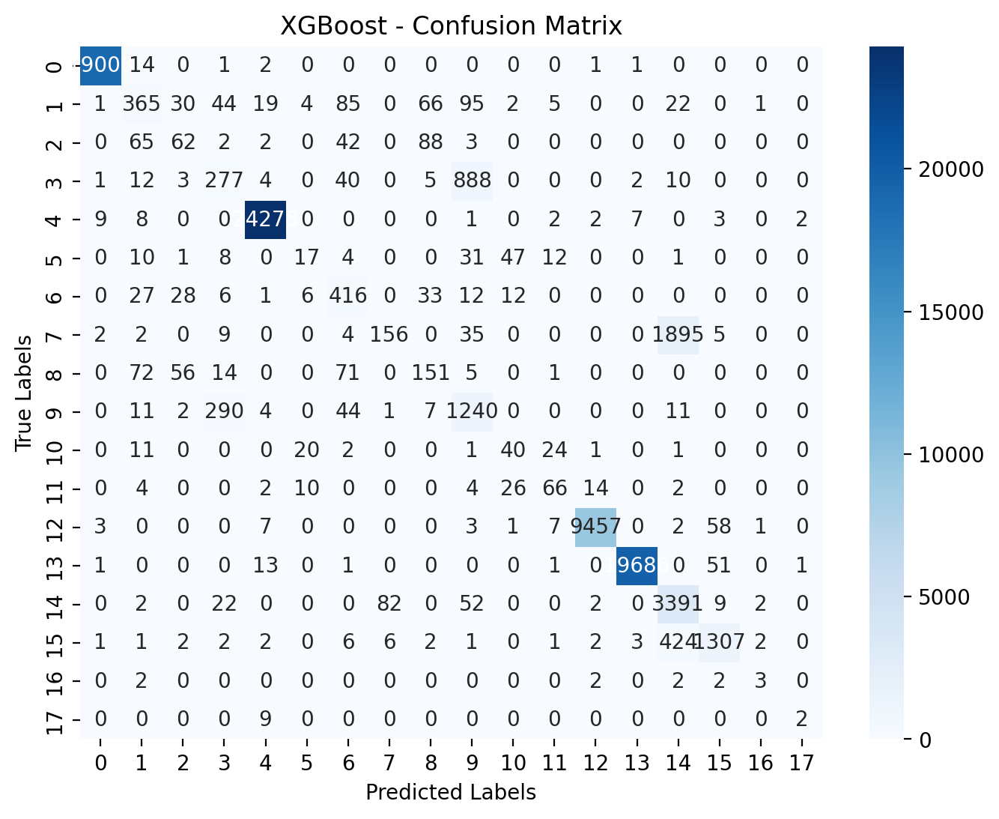

In [55]:
# Train and evaluate XGBoost Classifier
print("Training XGBoost...")

# Initialize XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb.fit(X_train, y_train)

# Predict on test set
y_pred_xgb = xgb.predict(X_test)

# Metrics
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb, average="weighted")
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)

# Print results
print(f"XGBoost Results:")
print(f"Accuracy: {accuracy_xgb:.4f}")
print(f"F1 Score: {f1_xgb:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_xgb))

# Confusion Matrix Plot
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='Blues', xticklabels=xgb.classes_, yticklabels=xgb.classes_)
plt.title("XGBoost - Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


## Model Saving

In [56]:
with open("../models/xgb_1.sav", "wb") as file:
    pickle.dump(xgb, file)

## Random Forest

Training Random Forest...
Random Forest Results:
Accuracy: 0.9351
F1 Score: 0.9268

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19027
           1       0.61      0.50      0.55       739
           2       0.28      0.07      0.11       264
           3       0.34      0.16      0.22      1242
           4       1.00      1.00      1.00     24312
           5       0.31      0.15      0.20       131
           6       0.57      0.78      0.66       541
           7       0.43      0.06      0.11      2108
           8       0.40      0.45      0.42       370
           9       0.49      0.76      0.60      1610
          10       0.29      0.28      0.29       100
          11       0.42      0.53      0.47       128
          12       1.00      0.99      0.99      9539
          13       1.00      1.00      1.00     19754
          14       0.58      0.93      0.72      3562
          15       0.91     

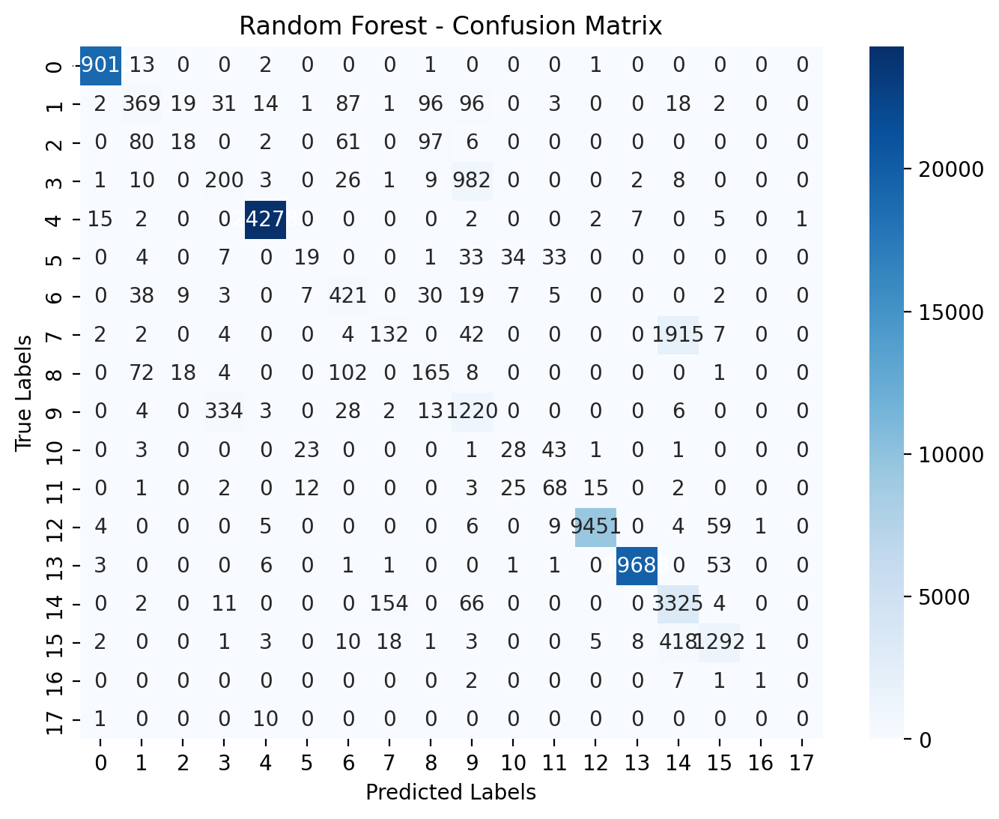

In [58]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Train and evaluate Random Forest Classifier
print("Training Random Forest...")

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predict on test set
y_pred_rf = rf.predict(X_test)

# Metrics
accuracy_rf = accuracy_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf, average="weighted")
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Print results
print(f"Random Forest Results:")
print(f"Accuracy: {accuracy_rf:.4f}")
print(f"F1 Score: {f1_rf:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))

# Confusion Matrix Plot
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', xticklabels=rf.classes_, yticklabels=rf.classes_)
plt.title("Random Forest - Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


## Model Saving

In [59]:
import pickle

# Save the trained Random Forest model
with open("../models/rf_model.sav", "wb") as file:
    pickle.dump(rf, file)

print("✅ Random Forest model saved successfully!")


✅ Random Forest model saved successfully!
